In [16]:
import os
import cv2
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as patches

import csv
import time
import operator

In [17]:
# Get count of number of files in this folder and all subfolders
def get_num_files(path):
  
    petal_detection_files = {}
    if not os.path.exists(path):
        return 0
    for r, d, files in os.walk(path):
                
        for file in files:
            petal_detection_files[file] = os.path.join(r, file)
            
    return petal_detection_files

In [18]:
petal_source_db = get_num_files(r'.\..\Storage\flowers_for_petals')

In [19]:
oxford102_labels = pd.read_csv('oxford102_flower_dataset_labels.txt', delimiter='\t', header=None, names=['Names'])
# Image labels are 1 based, changed the index of the image database label
oxford102_labels.index = np.arange(1, len(oxford102_labels) + 1)
print(oxford102_labels)
print()
print("Test Print: FLower Name and its unique label")
print(oxford102_labels.loc[77].get('Names'))

                            Names
1                 'pink primrose'
2     'hard-leaved pocket orchid'
3              'canterbury bells'
4                     'sweet pea'
5              'english marigold'
..                            ...
98              'mexican petunia'
99                     'bromelia'
100              'blanket flower'
101             'trumpet creeper'
102             'blackberry lily'

[102 rows x 1 columns]

Test Print: FLower Name and its unique label
 'passion flower'


In [21]:
def Remove_Freq_Values(original_image,filter_size,ratio):
    new_image = np.zeros_like(original_image)
    most_freq = []
    #cv2.calcHist(images, channels, mask, bins, ranges)
    mask = np.zeros(original_image.shape[:2],np.uint8)
    mask[0:,0:filter_size] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    mask[0:,-filter_size:-1] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    mask = np.zeros(original_image.shape[:2],np.uint8)
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    mask = np.zeros(original_image.shape[:2],np.uint8)
    mask[0:filter_size,0:] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    mask = np.zeros(original_image.shape[:2],np.uint8)
    mask[-filter_size:-1,0:] = 1
    hist = cv2.calcHist([original_image],[0],mask,[256],[0,256])
    for i in range(hist.shape[0]):
        if hist[i][0] >= hist[hist.argmax()][0]/ratio:
            most_freq.append(i)
    
    #most_freq_ratio = hist[hist.argmax()] / hist.sum()
    print(most_freq)
    for i in range(original_image.shape[0]):
        for j in range(original_image.shape[1]):
            #if hist[original_image[i][j][0]]/hist.sum() < (most_freq_ratio/ratio) and original_hist[original_image[i][j][0]]/original_hist.sum() < 0.05:
            if original_image[i][j][0] not in most_freq:
                new_image[i][j][0] = original_image[i][j][0]
                new_image[i][j][1] = original_image[i][j][1]
                new_image[i][j][2] = original_image[i][j][2]
    if cv2.compare(new_image,original_image,0).all():
        print("Nothing Changed")
    #original_hist = cv2.calcHist([original_image],[0],None,[256],[0,256])
    return new_image

In [22]:
def distance(x1, y1, x2, y2):
    length = math.sqrt(abs((x1 - x2))**2 + abs((y1 - y2))**2)
    return length

In [23]:
def intersection(line1, line2):
    """Finds the intersection of two lines given in Hesse normal form.

    Returns closest integer pixel locations.
    See https://stackoverflow.com/a/383527/5087436
    """
    rho1, theta1 = line1[0]
    rho2, theta2 = line2[0]
    A = np.array([
        [np.cos(theta1), np.sin(theta1)],
        [np.cos(theta2), np.sin(theta2)]
    ])
    b = np.array([[rho1], [rho2]])
    x0, y0 = np.linalg.solve(A, b)
    x0, y0 = int(np.round(x0)), int(np.round(y0))
    return x0, y0

In [24]:
def numbers_to_strings(argument): 
    switcher = { 
        0: "Rectangular", 
        1: "Circular", 
        2: "Elliptical", 
    } 
  
    # get() method of dictionary data type returns  
    # value of passed argument if it is present  
    # in dictionary otherwise second argument will 
    # be assigned as default value of passed argument 
    return switcher.get(argument, "nothing")

In [31]:
#Create a csv file to store petals information
with open('flowers_with_petals_info.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(["Category", "Name", "Petals"])


## Petals Count Algorithm

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 170,202,119  , HSI 82.47116503290214,0.2729124236252546,0.6418300653594771
[1, 2, 3, 4, 5, 6, 39, 40, 1, 2, 3, 4, 5, 6, 38, 39, 40, 41, 42, 43, 39, 40, 41, 42, 2, 3, 4, 5, 6, 7, 8, 9, 10, 172]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


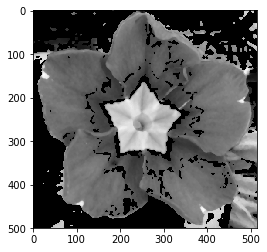

flower_category: 53
Petals count Algorithm started...
Number of Contours 117
Height 150, Width 324, Area 6789.5, extLeft: (183, 62), extRight: (506, 133), extTop: (239, 4), extBot: (488, 153), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 85529.85999398211, ellipse_area: 71884.27923846501, rect_area: 48600
Side 1: 80.62257748298549, Side 2: 168.35973390332975, Side 3: 131.54847015454038
Triangle Area: 5180.0, Chosen Area for petals count: Circle, Area: 6789.5, petals: 2
flower_name:  'primula'
Petal count Algorithm Ended.


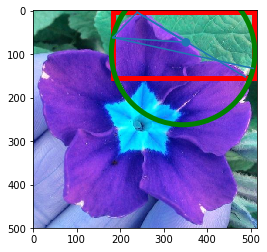

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 37,40,31  , HSI 79.10660535086907,0.13888888888888884,0.14342629482071712
[35, 38, 39, 40, 48, 52, 56, 35, 38, 39, 40, 42, 43, 46, 48, 52, 56, 30, 35, 36, 37, 43, 30, 34, 35, 36, 40, 41, 42, 43, 44, 45, 46, 48]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


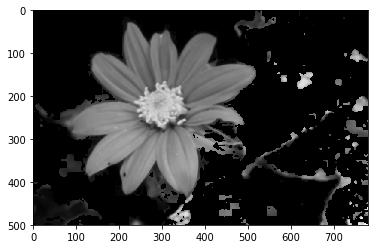

flower_category: 59
Petals count Algorithm started...
Number of Contours 64
Height 110, Width 126, Area 7746.5, extLeft: (233, 214), extRight: (358, 232), extTop: (305, 164), extBot: (303, 273), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 12468.981242097889, ellipse_area: 32120.36297927701, rect_area: 13860
Side 1: 87.65842800324451, Side 2: 64.19501538281614, Side 3: 55.57877292636101
Triangle Area: 1779.9999999999993, Chosen Area for petals count: Circle, Area: 7746.5, petals: 5
flower_name:  'orange dahlia'
Petal count Algorithm Ended.


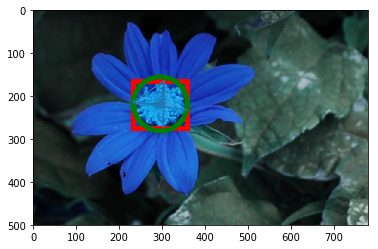

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 65,60,54  , HSI 33.00449159888309,0.09497206703910621,0.28144654088050314
[110, 114, 120, 126, 34, 35, 43, 110, 114, 120, 126, 0, 13, 20, 26, 30, 120, 0, 30, 66, 75, 83, 96, 103, 110]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


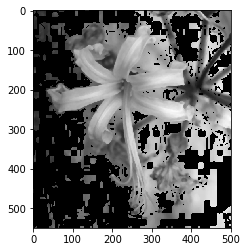

flower_category: 37
Petals count Algorithm started...
Number of Contours 127
Height 177, Width 182, Area 12506.5, extLeft: (233, 123), extRight: (414, 129), extTop: (280, 27), extBot: (315, 203), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 29559.245277626364, ellipse_area: 70686.00693869997, rect_area: 32214
Side 1: 106.88779163215975, Side 2: 79.00632886041473, Side 3: 102.1420579389313
Triangle Area: 3815.5000000000014, Chosen Area for petals count: Circle, Area: 12506.5, petals: 4
flower_name:  'cape flower'
Petal count Algorithm Ended.


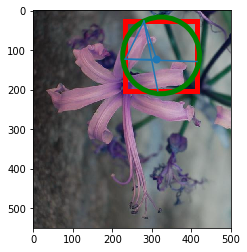

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 153,133,144  , HSI 326.69569481984405,0.07209302325581379,0.5620915032679739
[125, 126, 132, 133, 125, 126, 132, 133, 125, 126, 132, 133, 164, 166, 167, 126, 132, 140]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


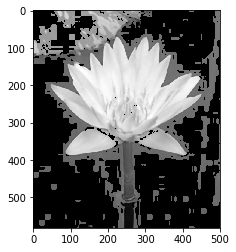

flower_category: 73
Petals count Algorithm started...
Number of Contours 56
Height 319, Width 406, Area 74381.0, extLeft: (46, 204), extRight: (451, 224), extTop: (223, 70), extBot: (404, 388), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 137227.90870145577, ellipse_area: 331475.70832672407, rect_area: 129514
Side 1: 222.00225224082752, Side 2: 205.6647757881743, Side 3: 169.01183390520322
Triangle Area: 16521.50000000001, Chosen Area for petals count: Circle, Area: 74381.0, petals: 5
flower_name:  'water lily'
Petal count Algorithm Ended.


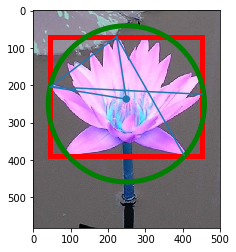

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 128,133,136  , HSI 201.78678929826174,0.032745591939546514,0.518954248366013
[20, 114, 120, 165, 42, 43, 44, 45, 46, 114, 120, 165, 0, 120, 165, 43, 120, 126, 140, 165]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


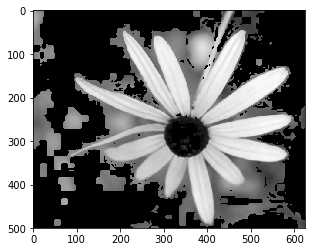

flower_category: 63
Petals count Algorithm started...
Number of Contours 18
Height 254, Width 432, Area 35904.0, extLeft: (162, 324), extRight: (593, 245), extTop: (565, 238), extBot: (407, 491), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 150673.9252588201, ellipse_area: 255968.37824945356, rect_area: 109728
Side 1: 412.0740224765449, Side 2: 235.35929979501554, Side 3: 195.0
Triangle Area: 12724.499999999996, Chosen Area for petals count: Circle, Area: 35904.0, petals: 3
flower_name:  'black-eyed susan'
Petal count Algorithm Ended.


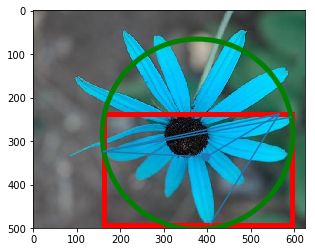

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 9,9,7  , HSI 60.00000000000001,0.15999999999999992,0.04006410256410256
[30, 36, 37, 38, 39, 36, 37, 38, 39, 30, 36, 37, 38, 39, 40, 37, 38, 39, 40, 110]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


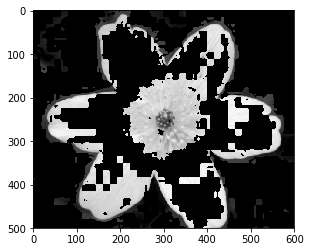

flower_category: 69
Petals count Algorithm started...
Number of Contours 82
Height 178, Width 210, Area 13114.0, extLeft: (95, 305), extRight: (304, 386), extTop: (119, 302), extBot: (164, 479), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 41547.56284372502, ellipse_area: 102830.39146992262, rect_area: 37380
Side 1: 24.186773244895647, Side 2: 134.7145129523913, Side 3: 122.96747537458837
Triangle Area: 1356.0000000000007, Chosen Area for petals count: Circle, Area: 13114.0, petals: 10
flower_name:  'windflower'
Petal count Algorithm Ended.


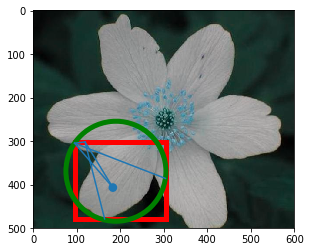

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 71,111,61  , HSI 109.10660535086909,0.24691358024691368,0.3176470588235294
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58, 129, 130, 131, 132, 133, 134, 135, 136, 138, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 129, 130, 131, 12, 13, 14, 15, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 33, 34, 35, 36, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 62, 63, 64, 65, 66, 68, 69, 11, 24, 26, 30, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 59, 63, 69, 73, 74, 75, 76, 80, 129, 160, 161, 163, 164, 165]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


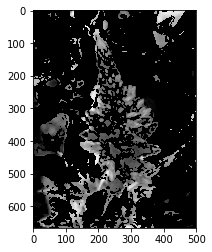

flower_category: 27
Petals count Algorithm started...
Number of Contours 260
Height 66, Width 68, Area 1563.5, extLeft: (276, 537), extRight: (343, 569), extTop: (315, 523), extBot: (319, 588), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 4300.840342764427, ellipse_area: 10157.166326175964, rect_area: 4488
Side 1: 41.43669871020132, Side 2: 35.34119409414458, Side 3: 29.832867780352597
Triangle Area: 516.5, Chosen Area for petals count: Circle, Area: 1563.5, petals: 4
flower_name:  'prince of wales feathers'
Petal count Algorithm Ended.


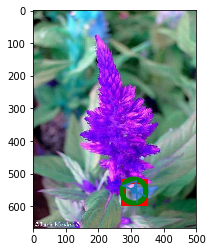

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 3,3,1  , HSI 60.00000000000001,0.5714285714285714,0.00915032679738562
[13, 15, 16, 17, 19, 20, 21, 23, 26, 13, 15, 16, 17, 19, 20, 21, 22, 23, 26, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 26, 15, 16, 17, 18, 19, 20]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


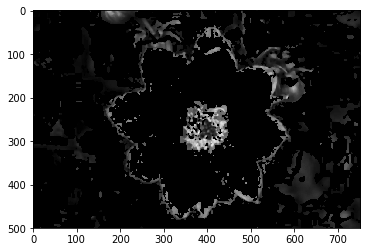

flower_category: 56
Petals count Algorithm started...
Number of Contours 2
Height 5, Width 5, Area 9.5, extLeft: (377, 281), extRight: (381, 281), extTop: (379, 279), extBot: (380, 283), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 12.566370614359172, ellipse_area: 51.9139654990908, rect_area: 25
Side 1: 2.8284271247461903, Side 2: 2.0, Side 3: 2.0
Triangle Area: 1.9999999999999991, Chosen Area for petals count: Circle, Area: 9.5, petals: 5
flower_name:  'bishop of llandaff'
Petal count Algorithm Ended.


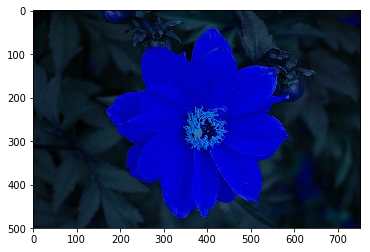

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 183,86,119  , HSI 340.454291736418,0.3350515463917526,0.5071895424836601
[170, 171, 172, 11, 12, 13, 30, 170, 171, 172, 65, 66, 68, 69, 103, 171, 172, 173, 5, 13, 19, 60, 71]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


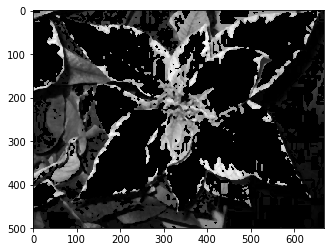

flower_category: 44
Petals count Algorithm started...
Number of Contours 232
Height 193, Width 219, Area 10886.0, extLeft: (268, 82), extRight: (486, 85), extTop: (391, 4), extBot: (345, 196), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 46759.46505603048, ellipse_area: 82588.0139769445, rect_area: 42267
Side 1: 145.64683312726027, Side 2: 99.46356116689167, Side 3: 98.2344135219425
Triangle Area: 4867.5, Chosen Area for petals count: Circle, Area: 10886.0, petals: 3
flower_name:  'poinsettia'
Petal count Algorithm Ended.


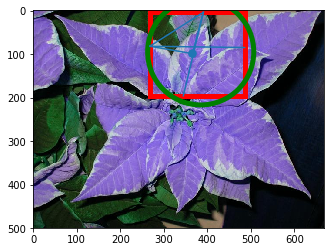

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 37,40,23  , HSI 69.51533819835656,0.30999999999999994,0.15432098765432095
[30, 32, 34, 35, 30, 34, 35, 34, 35, 16, 17, 19, 21, 22, 25, 26, 30, 35]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


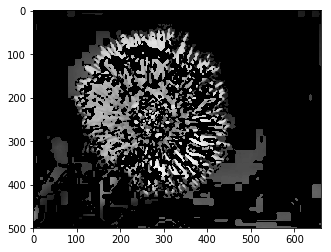

flower_category: 12
Petals count Algorithm started...
Number of Contours 170
Height 28, Width 60, Area 687.0, extLeft: (357, 296), extRight: (416, 306), extTop: (386, 285), extBot: (397, 312), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 2827.4333882308138, ellipse_area: 4114.443932479772, rect_area: 1680
Side 1: 31.016124838541646, Side 2: 30.14962686336267, Side 3: 14.035668847618199
Triangle Area: 208.4999999999999, Chosen Area for petals count: Circle, Area: 687.0, petals: 4
flower_name:  "colt's foot"
Petal count Algorithm Ended.


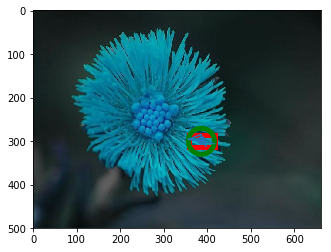

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 2,2,2  , HSI 0.0,0.0,0.00784313725490196
[30, 35, 36, 37, 38, 39, 40, 41, 42, 43, 30, 34, 35, 36, 37, 38, 39, 40, 30, 34, 35, 36, 37, 38, 39, 35, 36, 37, 38, 39, 40]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


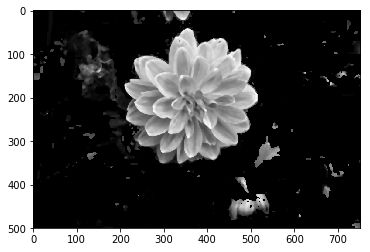

flower_category: 60
Petals count Algorithm started...
Number of Contours 63
Height 244, Width 307, Area 26855.0, extLeft: (209, 175), extRight: (515, 193), extTop: (352, 41), extBot: (320, 284), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 74506.01137253553, ellipse_area: 175384.5992791307, rect_area: 74908
Side 1: 195.97193676646665, Side 2: 161.78998732925348, Side 3: 111.30588483993108
Triangle Area: 9004.0, Chosen Area for petals count: Circle, Area: 26855.0, petals: 3
flower_name:  'pink-yellow dahlia?'
Petal count Algorithm Ended.


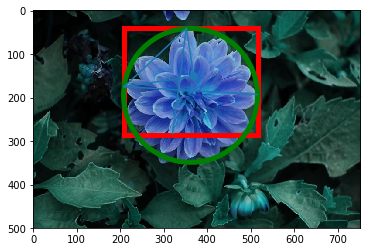

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 7,7,7  , HSI 0.0,0.0,0.027450980392156862
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


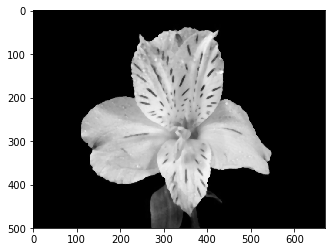

flower_category: 18
Petals count Algorithm started...
Number of Contours 67
Height 429, Width 439, Area 104262.5, extLeft: (110, 291), extRight: (548, 326), extTop: (348, 39), extBot: (362, 467), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 167638.52558820497, ellipse_area: 477142.76195756695, rect_area: 188331
Side 1: 346.6237152879185, Side 2: 216.3631207022121, Side 3: 215.45533179756774
Triangle Area: 22316.00000000001, Chosen Area for petals count: Circle, Area: 104262.5, petals: 5
flower_name:  'peruvian lily'
Petal count Algorithm Ended.


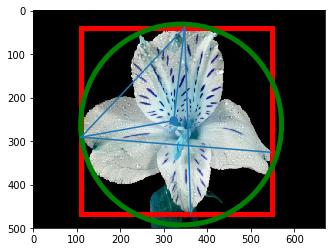

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 143,175,126  , HSI 100.02294231492829,0.14864864864864857,0.580392156862745
[40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 41, 42, 43, 44, 45, 46, 47, 48]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


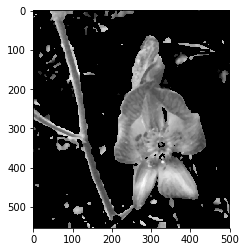

flower_category: 9
Petals count Algorithm started...
Number of Contours 115
Height 283, Width 182, Area 26524.5, extLeft: (242, 321), extRight: (423, 271), extTop: (285, 218), extBot: (273, 500), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 66051.9855417254, ellipse_area: 136286.64977867706, rect_area: 51506
Side 1: 111.61541112229978, Side 2: 91.706052144883, Side 3: 150.86417732516887
Triangle Area: 5096.000000000002, Chosen Area for petals count: Circle, Area: 26524.5, petals: 6
flower_name:  'monkshood'
Petal count Algorithm Ended.


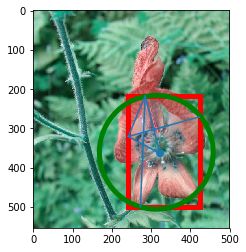

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 123,186,45  , HSI 86.48529463235415,0.6186440677966103,0.46274509803921565
[38, 43, 44, 45, 46, 47, 38, 42, 43, 44, 45, 46, 47, 48, 49, 50, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 171, 172, 173, 44, 45, 46, 47]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


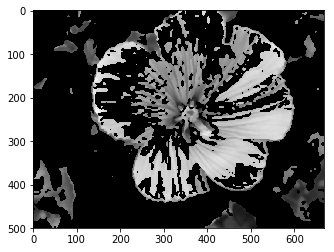

flower_category: 86
Petals count Algorithm started...
Number of Contours 203
Height 443, Width 463, Area 56770.5, extLeft: (139, 248), extRight: (601, 222), extTop: (423, 0), extBot: (304, 442), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 177952.37426994022, ellipse_area: 447141.7974925911, rect_area: 205109
Side 1: 377.04111181673545, Side 2: 288.6936092122581, Side 3: 268.02984908401527
Triangle Area: 38552.00000000001, Chosen Area for petals count: Circle, Area: 56770.5, petals: 2
flower_name:  'tree mallow'
Petal count Algorithm Ended.


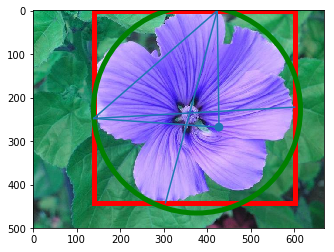

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 116,150,64  , HSI 83.10974348885817,0.4181818181818182,0.43137254901960786
[13, 14, 15, 16, 17, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 11, 12, 13, 15, 17, 35, 36, 37, 38, 39, 40, 41, 42, 43, 35, 36, 37, 38, 39, 40, 11, 12, 13, 14, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


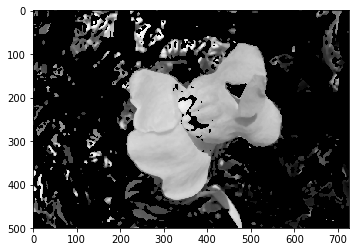

flower_category: 11
Petals count Algorithm started...
Number of Contours 136
Height 361, Width 371, Area 72185.5, extLeft: (202, 174), extRight: (572, 242), extTop: (472, 75), extBot: (338, 435), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 128189.54663707792, ellipse_area: 346723.97331837745, rect_area: 133931
Side 1: 287.57781555606823, Side 2: 190.53870997778904, Side 3: 196.01020381602586
Triangle Area: 18567.000000000004, Chosen Area for petals count: Circle, Area: 72185.5, petals: 4
flower_name:  'snapdragon'
Petal count Algorithm Ended.


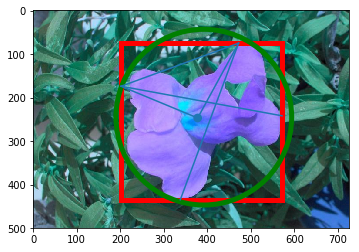

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 18,14,13  , HSI 10.893394649130864,0.1333333333333332,0.0588235294117647
[0, 6, 13, 35, 170, 173, 0, 170, 0, 170, 173, 170]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


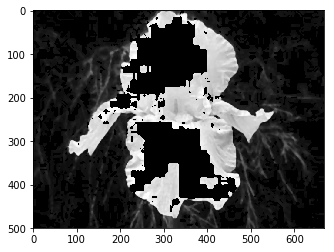

flower_category: 68
Petals count Algorithm started...
Number of Contours 66
Height 407, Width 475, Area 53717.0, extLeft: (80, 314), extRight: (554, 233), extTop: (312, 1), extBot: (470, 407), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 185507.9046018237, ellipse_area: 457181.8102664065, rect_area: 193325
Side 1: 389.60621144945827, Side 2: 283.0282671395209, Side 3: 224.89997776789573
Triangle Area: 31386.0, Chosen Area for petals count: Circle, Area: 53717.0, petals: 2
flower_name:  'bearded iris'
Petal count Algorithm Ended.


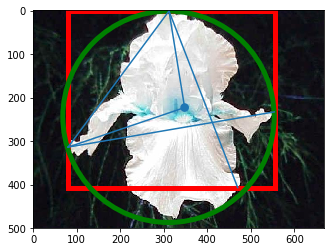

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 84,130,101  , HSI 141.434881662485,0.19999999999999984,0.41176470588235287
[55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 80, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 80, 83, 112, 114, 116, 120, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 80, 81, 83, 84, 85, 89, 93, 94, 95, 96, 97, 98]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


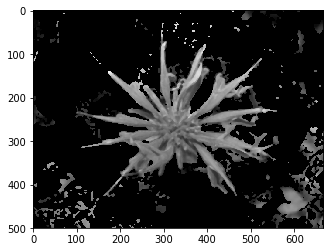

flower_category: 92
Petals count Algorithm started...
Number of Contours 188
Height 33, Width 147, Area 1479.0, extLeft: (406, 253), extRight: (552, 230), extTop: (512, 223), extBot: (411, 255), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 16741.547250980006, ellipse_area: 8234.15153830446, rect_area: 4851
Side 1: 110.16351483136329, Side 2: 66.21933252457322, Side 3: 43.965895873961216
Triangle Area: 59.0000000000293, Chosen Area for petals count: Circle, Area: 1479.0, petals: 26
flower_name:  'bee balm'
Petal count Algorithm Ended.


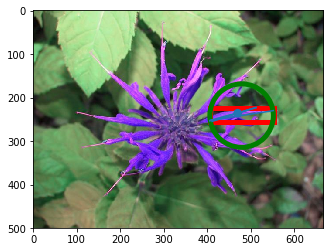

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 90,79,49  , HSI 44.97879504635642,0.32568807339449546,0.2849673202614379
[22, 24, 26, 27, 28, 29, 30, 31, 33, 34, 35, 36, 38, 39, 40, 41, 42, 22, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 42, 43, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 22, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 63]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


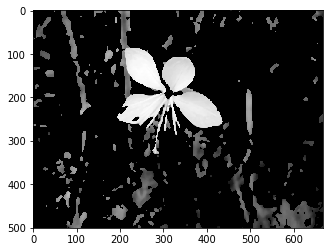

flower_category: 57
Petals count Algorithm started...
Number of Contours 38
Height 221, Width 244, Area 24673.5, extLeft: (193, 248), extRight: (436, 254), extTop: (219, 85), extBot: (284, 305), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 61575.216010359945, ellipse_area: 129127.03915978484, rect_area: 53924
Side 1: 165.0605949341029, Side 2: 125.70600622086441, Side 3: 134.31678971744373
Triangle Area: 8279.499999999998, Chosen Area for petals count: Circle, Area: 24673.5, petals: 3
flower_name:  'gaura'
Petal count Algorithm Ended.


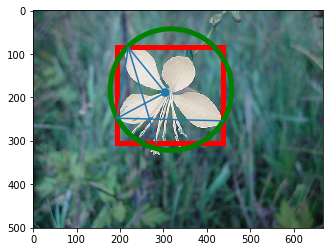

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 230,198,160  , HSI 32.833094526078156,0.18367346938775508,0.7686274509803921
[15, 16, 17, 18, 15, 16, 17, 18, 14, 15, 16, 17, 133, 135, 138, 16, 17, 18]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


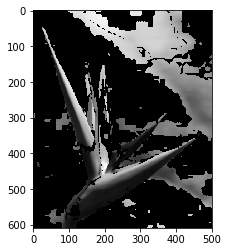

flower_category: 8
Petals count Algorithm started...
Number of Contours 82
Height 170, Width 239, Area 6688.5, extLeft: (167, 397), extRight: (405, 385), extTop: (186, 318), extBot: (186, 487), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 52279.24334838775, ellipse_area: 598419.0517640446, rect_area: 40630
Side 1: 81.25269226308751, Side 2: 74.84650960465692, Side 3: 119.01260437449471
Triangle Area: 3001.0000000000005, Chosen Area for petals count: Circle, Area: 6688.5, petals: 3
flower_name:  'bird of paradise'
Petal count Algorithm Ended.


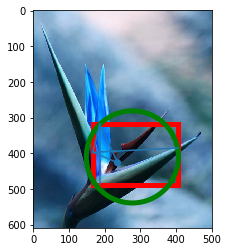

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 93,106,37  , HSI 70.21137049860282,0.5296610169491525,0.3084967320261437
[2, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 57, 58, 59, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 23, 24, 25, 46, 47, 48, 49, 50, 51, 52, 53, 5, 8, 10, 47, 48, 49]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


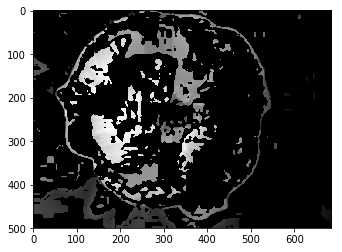

flower_category: 16
Petals count Algorithm started...
Number of Contours 121
Height 118, Width 119, Area 6592.0, extLeft: (132, 254), extRight: (250, 269), extTop: (139, 236), extBot: (195, 353), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 14102.60942196458, ellipse_area: 37400.42103631009, rect_area: 14042
Side 1: 19.313207915827967, Side 2: 62.48199740725323, Side 3: 71.02816342831905
Triangle Area: 572.0000000000009, Chosen Area for petals count: Circle, Area: 6592.0, petals: 12
flower_name:  'globe-flower'
Petal count Algorithm Ended.


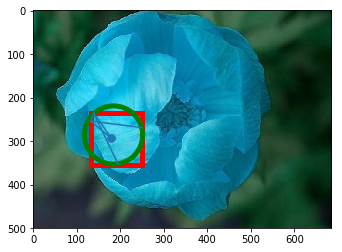

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 17,31,16  , HSI 116.58201890808792,0.25,0.08366013071895424
[49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 73, 74, 75, 77, 80, 82, 83, 86, 87, 94, 11, 13, 14, 15, 16, 17, 21, 48, 49, 50, 51, 52, 53, 54, 55, 56, 74, 75, 77, 80, 83, 87, 11, 12, 13, 14, 15, 16, 17, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 66, 67, 69, 70, 71, 73, 74, 75, 77, 78, 80, 82, 83, 84, 85, 86, 87, 91, 92, 47, 48, 49, 50, 51, 52, 53, 54, 55]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


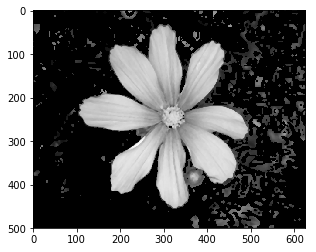

flower_category: 34
Petals count Algorithm started...
Number of Contours 40
Height 421, Width 265, Area 50785.5, extLeft: (175, 117), extRight: (439, 98), extTop: (290, 35), extBot: (326, 455), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 138544.23602330987, ellipse_area: 291611.6708915646, rect_area: 111565
Side 1: 141.24092891226678, Side 2: 162.1141573089778, Side 3: 191.06543381784158
Triangle Area: 11187.500000000007, Chosen Area for petals count: Circle, Area: 50785.5, petals: 5
flower_name:  'mexican aster'
Petal count Algorithm Ended.


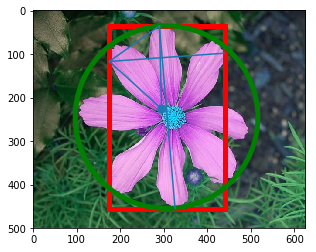

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 18,13,7  , HSI 33.00449159888308,0.4473684210526315,0.04967320261437908
[19, 20, 21, 22, 23, 24, 26, 28, 29, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 35, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 51, 53, 55, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 53]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


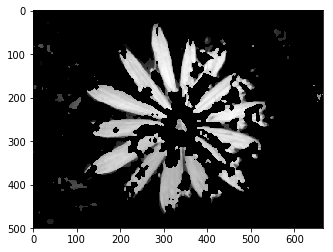

flower_category: 38
Petals count Algorithm started...
Number of Contours 52
Height 81, Width 185, Area 5694.0, extLeft: (124, 187), extRight: (308, 242), extTop: (150, 171), extBot: (293, 251), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 28952.917895483533, ellipse_area: 23918.39631406405, rect_area: 14985
Side 1: 30.528675044947494, Side 2: 88.05679985100527, Side 3: 70.7248188403477
Triangle Area: 978.9999999999997, Chosen Area for petals count: Circle, Area: 5694.0, petals: 6
flower_name:  'great masterwort'
Petal count Algorithm Ended.


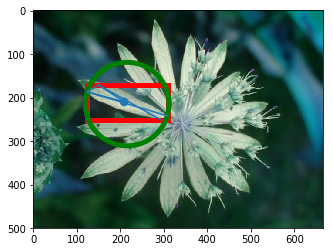

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 7,9,4  , HSI 83.41322444637053,0.4,0.02812939521800281
[35, 38, 39, 40, 42, 43, 44, 38, 39, 40, 42, 43, 44, 38, 39, 40, 41, 42, 43, 44, 45, 46, 40, 41, 42, 43, 44]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


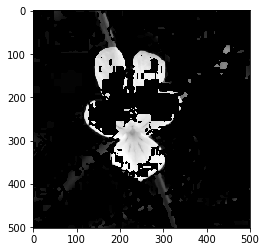

flower_category: 52
Petals count Algorithm started...
Number of Contours 57
Height 136, Width 198, Area 10354.0, extLeft: (129, 267), extRight: (326, 241), extTop: (243, 239), extBot: (237, 374), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 32047.38665926948, ellipse_area: 67543.86837244706, rect_area: 26928
Side 1: 117.38824472663352, Side 2: 109.41663493271945, Side 3: 62.80127387243033
Triangle Area: 3394.0000000000023, Chosen Area for petals count: Circle, Area: 10354.0, petals: 4
flower_name:  'wild pansy'
Petal count Algorithm Ended.


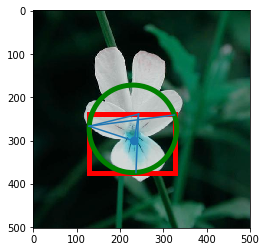

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 63,30,0  , HSI 28.42517128680523,1.0,0.1215686274509804
[9, 10, 11, 12, 9, 10, 11, 12, 13, 9, 10, 11, 12, 13, 0, 1, 2, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 26, 28, 29, 30, 32, 33, 34, 35, 36, 37, 179]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


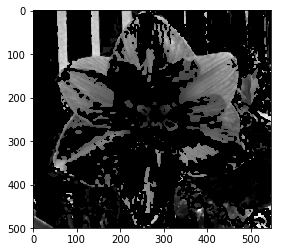

flower_category: 91
Petals count Algorithm started...
Number of Contours 196
Height 76, Width 127, Area 3730.5, extLeft: (347, 109), extRight: (473, 128), extTop: (365, 94), extBot: (427, 169), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 12867.963509103793, ellipse_area: 21870.259546072488, rect_area: 9652
Side 1: 23.430749027719962, Side 2: 75.13321502504735, Side 3: 62.609903369994115
Triangle Area: 671.9999999999997, Chosen Area for petals count: Circle, Area: 3730.5, petals: 6
flower_name:  'hippeastrum '
Petal count Algorithm Ended.


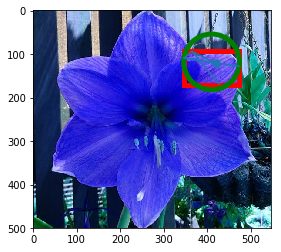

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 38,50,2  , HSI 73.89788624801398,0.9333333333333333,0.12244897959183673
[35, 36, 38, 39, 40, 35, 36, 38, 39, 40, 41, 42, 43, 36, 38, 39, 40, 41, 42, 38, 39, 40, 41, 42, 43]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


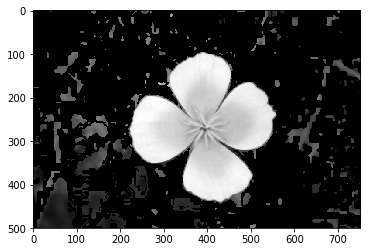

flower_category: 65
Petals count Algorithm started...
Number of Contours 7
Height 345, Width 249, Area 47555.0, extLeft: (308, 173), extRight: (556, 237), extTop: (388, 96), extBot: (430, 440), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 94024.72652928892, ellipse_area: 215917.43109139265, rect_area: 85905
Side 1: 111.03603018840326, Side 2: 150.0, Side 3: 171.72361514946044
Triangle Area: 8220.000000000002, Chosen Area for petals count: Circle, Area: 47555.0, petals: 6
flower_name:  'californian poppy'
Petal count Algorithm Ended.


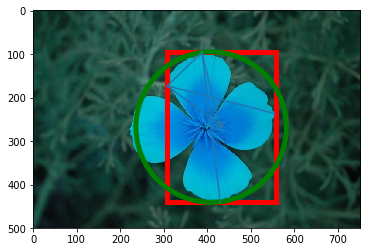

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 10,28,2  , HSI 102.51982979723964,0.85,0.0522875816993464
[44, 45, 46, 47, 48, 49, 51, 52, 53, 54, 55, 56, 57, 58, 59, 35, 36, 37, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 49, 50, 51, 52, 53, 54]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


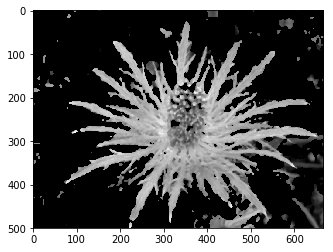

flower_category: 35
Petals count Algorithm started...
Number of Contours 158
Height 474, Width 579, Area 91164.5, extLeft: (74, 396), extRight: (652, 289), extTop: (351, 24), extBot: (452, 497), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 273397.10067865177, ellipse_area: 500983.10593262874, rect_area: 274446
Side 1: 463.80275980205204, Side 2: 308.05843601498725, Side 3: 248.05039810490126
Triangle Area: 35277.999999999985, Chosen Area for petals count: Circle, Area: 91164.5, petals: 3
flower_name:  'alpine sea holly'
Petal count Algorithm Ended.


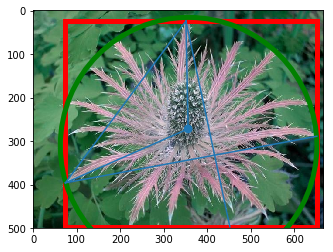

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 89,105,17  , HSI 69.82642981583228,0.7582938388625592,0.27581699346405225
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 145, 146, 147, 148, 149, 150, 151, 152, 39, 40, 41, 42, 43, 44, 45, 46, 50, 60, 42, 43, 44, 45, 46, 47, 48, 49, 50, 55, 60, 151, 152, 153, 154, 41, 42, 43, 44, 144, 145, 146, 147, 148, 149, 150, 151, 152]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


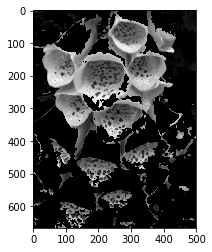

flower_category: 94
Petals count Algorithm started...
Number of Contours 195
Height 349, Width 399, Area 57203.5, extLeft: (30, 156), extRight: (428, 227), extTop: (257, 10), extBot: (118, 358), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 133316.62584773646, ellipse_area: 294036.96352862247, rect_area: 139251
Side 1: 269.89812893015767, Side 2: 187.57931655702342, Side 3: 181.91481522954638
Triangle Area: 17023.499999999985, Chosen Area for petals count: Circle, Area: 57203.5, petals: 4
flower_name:  'foxglove'
Petal count Algorithm Ended.


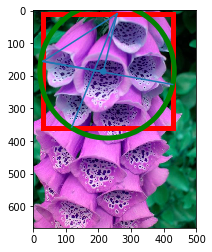

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 255,255,255  , HSI 0.0,0.0,1.0
[0, 46, 47, 0, 45, 46, 47, 48, 49, 50, 51, 0, 44, 45, 46, 47, 48, 49, 50, 51, 0, 1, 2, 3, 4, 5, 6, 30, 35, 36, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 80, 90, 150]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


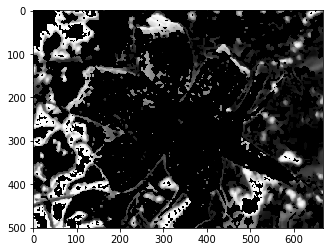

flower_category: 6
Petals count Algorithm started...
Number of Contours 291
Height 61, Width 108, Area 3071.0, extLeft: (239, 40), extRight: (346, 42), extTop: (283, 6), extBot: (277, 66), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 8824.73376393373, ellipse_area: 14512.876014458632, rect_area: 6588
Side 1: 55.60575509783138, Side 2: 53.23532661682466, Side 3: 30.364452901377952
Triangle Area: 791.0, Chosen Area for petals count: Circle, Area: 3071.0, petals: 4
flower_name:  'tiger lily'
Petal count Algorithm Ended.


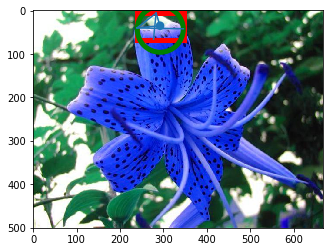

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 28,40,18  , HSI 93.00449159888306,0.37209302325581395,0.1225071225071225
[0, 55, 56, 60, 62, 63, 66, 68, 69, 70, 74, 75, 80, 0, 50, 60, 66, 69, 74, 75, 80, 83, 84, 90, 0, 55, 66, 75, 80, 83, 84, 87, 90, 96, 110, 50, 66, 70, 73, 74, 75, 79, 80, 83, 84]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


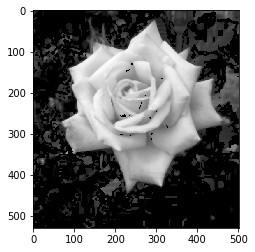

flower_category: 74
Petals count Algorithm started...
Number of Contours 21
Height 314, Width 331, Area 57886.5, extLeft: (71, 273), extRight: (401, 137), extTop: (288, 30), extBot: (211, 343), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 99538.22163633902, ellipse_area: 240542.74553696654, rect_area: 103934
Side 1: 325.7882748043582, Side 2: 180.7097119692243, Side 3: 168.90825912311098
Triangle Area: 10326.0, Chosen Area for petals count: Circle, Area: 57886.5, petals: 6
flower_name:  'rose'
Petal count Algorithm Ended.


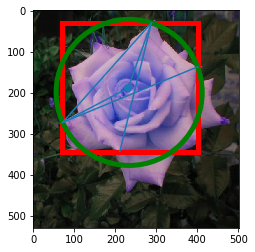

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 44,51,18  , HSI 71.61248153768341,0.5221238938053097,0.14771241830065357
[0, 30, 34, 35, 36, 37, 38, 39, 40, 0, 20, 30, 34, 35, 36, 37, 38, 39, 40, 41, 43, 34, 35, 36, 37, 38, 39, 40, 30, 35, 36, 37, 38, 39, 40]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


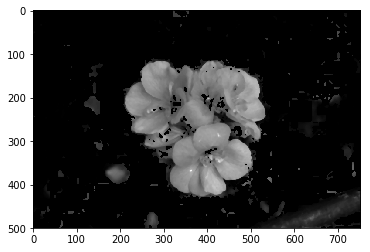

flower_category: 58
Petals count Algorithm started...
Number of Contours 57
Height 43, Width 64, Area 1615.0, extLeft: (424, 369), extRight: (487, 360), extTop: (438, 346), extBot: (463, 388), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 3019.0705400997913, ellipse_area: 6814.068429521782, rect_area: 2752
Side 1: 26.92582403567252, Side 2: 31.064449134018133, Side 3: 27.018512172212592
Triangle Area: 342.50000000000006, Chosen Area for petals count: Circle, Area: 1615.0, petals: 5
flower_name:  'geranium'
Petal count Algorithm Ended.


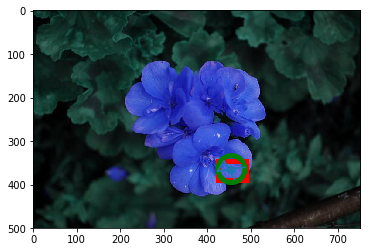

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 166,181,162  , HSI 108.48248411810582,0.045186640471512884,0.665359477124183
[33, 34, 35, 36, 37, 38, 39, 40, 51, 54, 34, 35, 36, 37, 38, 39, 54, 35, 36, 37, 54, 35, 36, 37, 38, 39]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


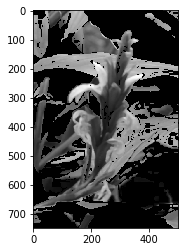

flower_category: 61
Petals count Algorithm started...
Number of Contours 166
Height 44, Width 119, Area 1821.5, extLeft: (58, 525), extRight: (176, 488), extTop: (147, 485), extBot: (85, 528), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 11689.86626400762, ellipse_area: 9440.044448937628, rect_area: 5236
Side 1: 97.57561170702442, Side 2: 67.1863081289633, Side 3: 33.24154027718932
Triangle Area: 543.5000000000006, Chosen Area for petals count: Circle, Area: 1821.5, petals: 4
flower_name:  'cautleya spicata'
Petal count Algorithm Ended.


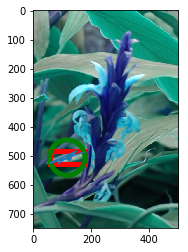

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 55,102,70  , HSI 138.20450534351542,0.27312775330396477,0.29673202614379085
[64, 65, 68, 69, 71, 72, 77, 49, 63, 64, 65, 68, 69, 54, 55, 56, 69, 70, 71, 72, 65, 66, 67]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


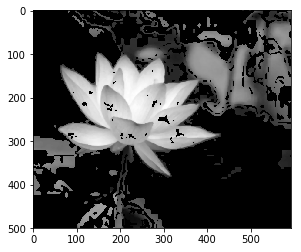

flower_category: 78
Petals count Algorithm started...
Number of Contours 60
Height 280, Width 364, Area 51371.5, extLeft: (58, 274), extRight: (421, 286), extTop: (150, 100), extBot: (312, 379), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 115811.67158193413, ellipse_area: 240271.0676039829, rect_area: 101920
Side 1: 196.82479518597245, Side 2: 176.3774361986249, Side 3: 149.04026301640775
Triangle Area: 12627.999999999993, Chosen Area for petals count: Circle, Area: 51371.5, petals: 5
flower_name:  'lotus'
Petal count Algorithm Ended.


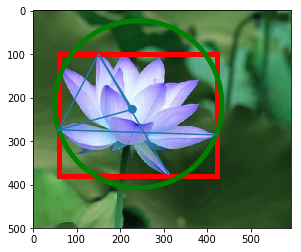

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 46,52,48  , HSI 139.1066053508691,0.0547945205479452,0.19084967320261437
[30, 36, 42, 24, 35, 36, 42, 30, 35, 36, 42, 43, 50, 24, 30, 36, 42]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


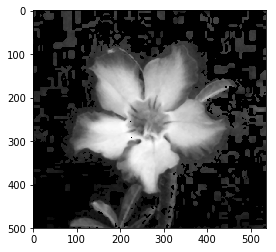

flower_category: 85
Petals count Algorithm started...
Number of Contours 21
Height 324, Width 350, Area 54155.5, extLeft: (101, 316), extRight: (450, 175), extTop: (333, 97), extBot: (269, 420), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 111036.45074847765, ellipse_area: 249808.89330284114, rect_area: 113400
Side 1: 319.03761533712606, Side 2: 176.23280057923384, Side 3: 166.9281282468596
Triangle Area: 10076.5, Chosen Area for petals count: Circle, Area: 54155.5, petals: 6
flower_name:  'desert-rose'
Petal count Algorithm Ended.


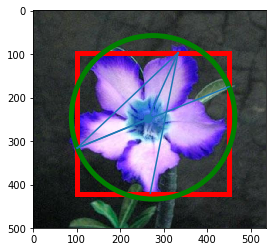

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 226,120,230  , HSI 298.1628668607326,0.375,0.7529411764705882
[0, 74, 76, 77, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 93, 94, 141, 142, 143, 144, 145, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 0, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 60, 66, 68, 69, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 93, 94, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 0, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 65, 66, 120, 149, 0, 59, 60]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


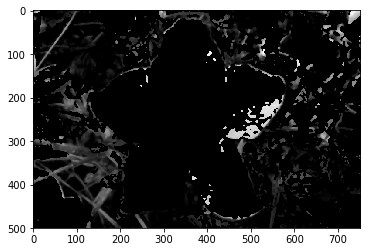

flower_category: 72
Petals count Algorithm started...
Number of Contours 94
Height 34, Width 81, Area 1623.5, extLeft: (441, 289), extRight: (521, 277), extTop: (498, 263), extBot: (501, 296), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 5026.548245743669, ellipse_area: 7469.283501438835, rect_area: 2754
Side 1: 62.64982043070834, Side 2: 43.73785545725808, Side 3: 22.80350850198276
Triangle Area: 330.9999999999999, Chosen Area for petals count: Circle, Area: 1623.5, petals: 5
flower_name:  'azalea'
Petal count Algorithm Ended.


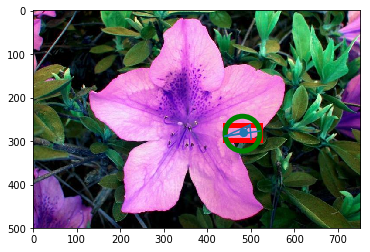

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 12,12,10  , HSI 60.00000000000001,0.11764705882352944,0.04444444444444444
[0, 30, 36, 42, 50, 66, 30, 35, 36, 42, 50, 30, 35, 36, 42, 0, 30, 36, 50, 55, 56, 60, 63, 66, 70]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


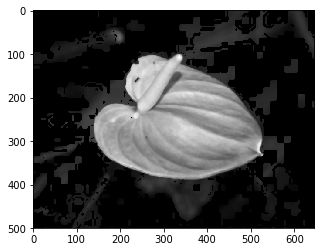

flower_category: 80
Petals count Algorithm started...
Number of Contours 34
Height 286, Width 389, Area 40574.0, extLeft: (139, 271), extRight: (527, 331), extTop: (331, 101), extBot: (342, 386), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 121922.06929316626, ellipse_area: 264039.4237089257, rect_area: 111254
Side 1: 256.44492586128507, Side 2: 148.56984889270097, Side 3: 163.04907236779974
Triangle Area: 11332.0, Chosen Area for petals count: Circle, Area: 40574.0, petals: 4
flower_name:  'anthurium'
Petal count Algorithm Ended.


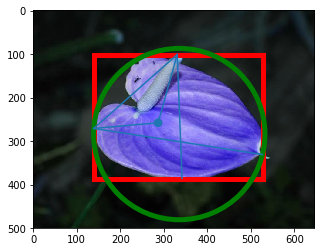

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 63,63,51  , HSI 60.00000000000001,0.1355932203389829,0.23137254901960783
[43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 46, 47, 48, 49, 50, 51, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 59]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


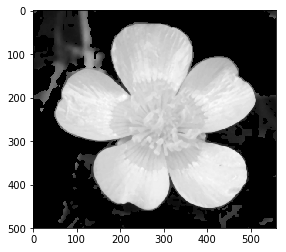

flower_category: 48
Petals count Algorithm started...
Number of Contours 7
Height 429, Width 462, Area 130582.0, extLeft: (50, 243), extRight: (511, 203), extTop: (248, 30), extBot: (273, 458), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 179450.91396570255, ellipse_area: 525807.1675064362, rect_area: 198198
Side 1: 290.81437378506587, Side 2: 240.13329631685815, Side 3: 224.95555116511352
Triangle Area: 26352.000000000004, Chosen Area for petals count: Circle, Area: 130582.0, petals: 5
flower_name:  'buttercup'
Petal count Algorithm Ended.


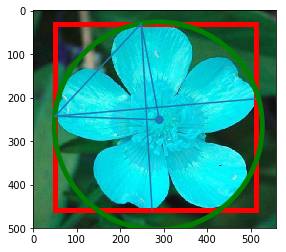

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 12,18,16  , HSI 160.8933946491309,0.21739130434782605,0.06013071895424836
[21, 26, 30, 34, 35, 43, 48, 51, 55, 60, 66, 70, 80, 83, 35, 43, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 60, 66, 70, 73, 74, 80, 83, 0, 6, 11, 13, 21, 26, 30, 34, 35, 38, 42, 43, 48, 50, 51, 56, 60, 66, 70, 80, 83, 87, 96, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 80]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


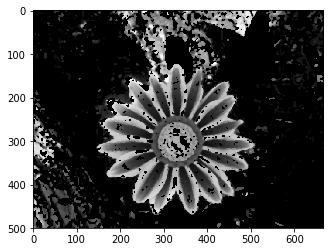

flower_category: 71
Petals count Algorithm started...
Number of Contours 253
Height 456, Width 331, Area 30366.5, extLeft: (145, 315), extRight: (475, 366), extTop: (291, 14), extBot: (366, 469), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 167638.52558820497, ellipse_area: 306628.32683803275, rect_area: 150936
Side 1: 334.53998266276034, Side 2: 148.67750334196495, Side 3: 264.0075756488817
Triangle Area: 18971.0, Chosen Area for petals count: Circle, Area: 30366.5, petals: 2
flower_name:  'gazania'
Petal count Algorithm Ended.


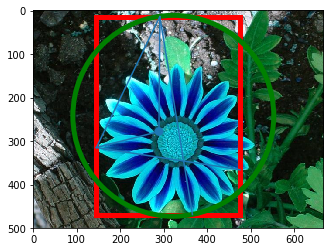

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 56,58,53  , HSI 83.41322444637052,0.04790419161676629,0.2183006535947712
[25, 35, 36, 19, 25, 35, 36, 50, 80, 83, 87, 90, 92, 25, 30, 35, 36, 50, 83, 90, 96]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


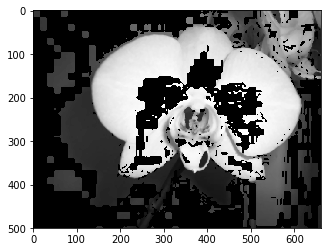

flower_category: 7
Petals count Algorithm started...
Number of Contours 161
Height 39, Width 58, Area 940.5, extLeft: (447, 353), extRight: (504, 369), extTop: (449, 334), extBot: (498, 372), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 3216.990877275948, ellipse_area: 6704.836083674481, rect_area: 2262
Side 1: 19.1049731745428, Side 2: 28.0178514522438, Side 3: 31.622776601683793
Triangle Area: 265.0, Chosen Area for petals count: Circle, Area: 940.5, petals: 4
flower_name:  'moon orchid'
Petal count Algorithm Ended.


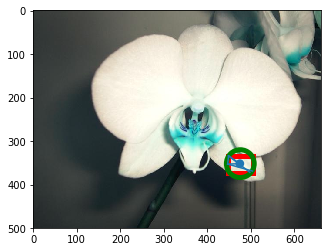

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 87,93,93  , HSI 180.0,0.04395604395604391,0.4080717488789237
[13, 16, 20, 24, 30, 35, 36, 38, 13, 15, 16, 19, 20, 24, 30, 34, 35, 36, 37, 38, 30, 34, 35, 36, 13, 15, 16, 19, 21, 24]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


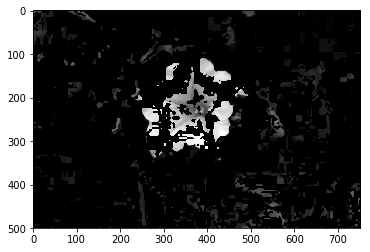

flower_category: 51
Petals count Algorithm started...
Number of Contours 56
Height 100, Width 109, Area 3530.5, extLeft: (297, 220), extRight: (405, 274), extTop: (335, 190), extBot: (320, 289), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 12867.963509103793, ellipse_area: 25827.01797970719, rect_area: 10900
Side 1: 48.41487374764082, Side 2: 49.24428900898052, Side 3: 54.230987451824994
Triangle Area: 1100.9999999999998, Chosen Area for petals count: Circle, Area: 3530.5, petals: 4
flower_name:  'petunia'
Petal count Algorithm Ended.


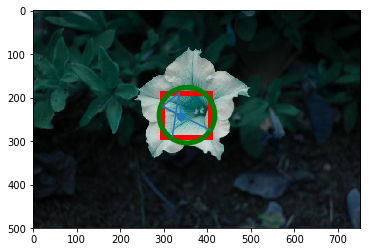

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 82,64,60  , HSI 9.826429815832276,0.12621359223300976,0.269281045751634
[0, 4, 5, 6, 8, 9, 10, 11, 165, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 0, 4, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 167, 170, 172, 173, 175, 176, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 177, 178, 179]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


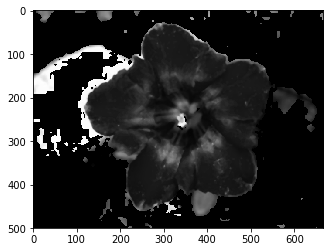

flower_category: 28
Petals count Algorithm started...
Number of Contours 55
Height 207, Width 131, Area 4855.5, extLeft: (101, 221), extRight: (231, 115), extTop: (194, 101), extBot: (154, 307), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 34636.05900582747, ellipse_area: 71664.29305468514, rect_area: 27117
Side 1: 151.81897114655993, Side 2: 61.05735008989499, Side 3: 97.082439194738
Triangle Area: 1631.9999999999984, Chosen Area for petals count: Circle, Area: 4855.5, petals: 3
flower_name:  'stemless gentian'
Petal count Algorithm Ended.


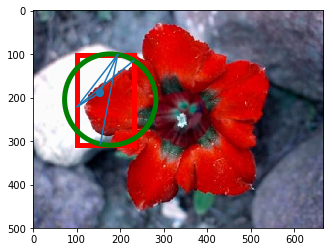

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 3,3,1  , HSI 60.00000000000001,0.5714285714285714,0.00915032679738562
[0, 30, 0, 30, 0, 30, 0, 30, 48, 50, 51, 54, 59]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


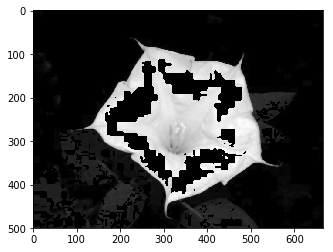

flower_category: 75
Petals count Algorithm started...
Number of Contours 19
Height 390, Width 433, Area 91178.5, extLeft: (117, 272), extRight: (549, 354), extTop: (242, 73), extBot: (305, 462), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 156228.26107036683, ellipse_area: 404857.4147799351, rect_area: 168870
Side 1: 235.00212764994276, Side 2: 226.63847863944022, Side 3: 208.1465829649865
Triangle Area: 21424.499999999993, Chosen Area for petals count: Circle, Area: 91178.5, petals: 5
flower_name:  'thorn apple'
Petal count Algorithm Ended.


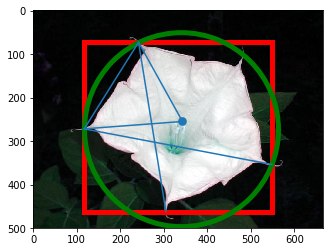

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 177,166,180  , HSI 288.2584690041092,0.04780114722753326,0.6836601307189542
[28, 48, 56, 57, 63, 152, 160, 162, 48, 51, 55, 56, 57, 63, 159, 22, 23, 24, 25, 26, 27, 28, 29, 35, 48, 50, 51, 53, 55, 56, 146, 150, 152, 153, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 43, 48, 51, 52, 55, 56, 57, 60, 63, 66]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


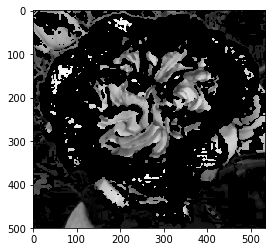

flower_category: 31
Petals count Algorithm started...
Number of Contours 238
Height 62, Width 102, Area 3141.0, extLeft: (146, 264), extRight: (247, 268), extTop: (217, 229), extBot: (213, 290), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 7853.981633974483, ellipse_area: 15673.153914321494, rect_area: 6324
Side 1: 79.1580697086532, Side 2: 58.215118311311535, Side 3: 32.69556544854363
Triangle Area: 837.4999999999998, Chosen Area for petals count: Circle, Area: 3141.0, petals: 4
flower_name:  'carnation'
Petal count Algorithm Ended.


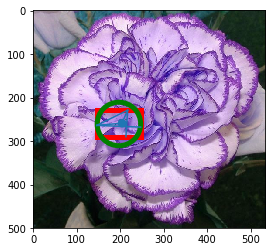

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 42,74,27  , HSI 101.79549465648458,0.43356643356643354,0.18692810457516335
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 26, 30, 34, 35, 36, 38, 40, 42, 43, 17, 19, 22, 24, 26, 30, 35, 36, 43, 44, 45, 46, 24, 30, 34, 35, 36, 38, 40, 42, 43]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


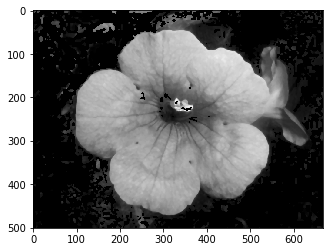

flower_category: 101
Petals count Algorithm started...
Number of Contours 61
Height 207, Width 370, Area 36575.0, extLeft: (201, 107), extRight: (570, 181), extTop: (312, 44), extBot: (474, 250), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 112220.83117888101, ellipse_area: 162781.88677149432, rect_area: 76590
Side 1: 127.63228431709588, Side 2: 192.5123372669918, Side 3: 122.78843593759146
Triangle Area: 7705.500000000005, Chosen Area for petals count: Circle, Area: 36575.0, petals: 5
flower_name:  'trumpet creeper'
Petal count Algorithm Ended.


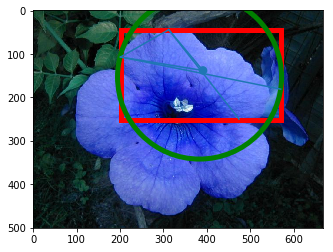

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 41,40,22  , HSI 57.3198160526073,0.35922330097087385,0.13517060367454067
[13, 19, 20, 24, 25, 35, 13, 19, 20, 21, 24, 25, 26, 28, 29, 35, 0, 13, 20, 21, 22, 25, 26, 27, 28, 29, 30, 32, 120, 13, 16]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


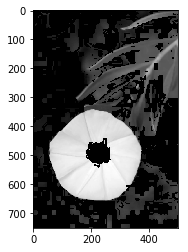

flower_category: 64
Petals count Algorithm started...
Number of Contours 24
Height 316, Width 321, Area 75287.5, extLeft: (55, 503), extRight: (375, 481), extTop: (207, 340), extBot: (253, 655), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 83468.97521322721, ellipse_area: 303074.6268679289, rect_area: 101436
Side 1: 222.87440409342656, Side 2: 160.00312496948303, Side 3: 162.19741058352318
Triangle Area: 12964.0, Chosen Area for petals count: Circle, Area: 75287.5, petals: 6
flower_name:  'silverbush'
Petal count Algorithm Ended.


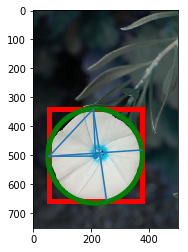

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 106,103,84  , HSI 52.77710185918423,0.13993174061433433,0.3830065359477124
[24, 26, 27, 28, 29, 33, 34, 35, 37, 42, 24, 26, 27, 29, 33, 34, 35, 37, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 34, 35, 35, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


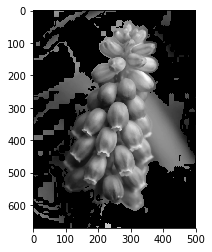

flower_category: 25
Petals count Algorithm started...
Number of Contours 62
Height 224, Width 162, Area 13262.5, extLeft: (247, 297), extRight: (408, 400), extTop: (347, 251), extBot: (336, 474), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 38707.56308487984, ellipse_area: 72249.47845278143, rect_area: 36288
Side 1: 110.07270324653611, Side 2: 101.51354589413178, Side 3: 104.23531071570709
Triangle Area: 4781.999999999999, Chosen Area for petals count: Circle, Area: 13262.5, petals: 3
flower_name:  'grape hyacinth'
Petal count Algorithm Ended.


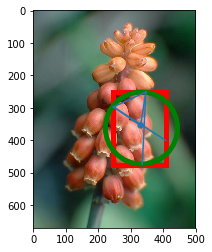

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 7,10,1  , HSI 79.1066053508691,0.8333333333333334,0.02531645569620253
[40, 43, 45, 46, 48, 51, 24, 25, 35, 36, 38, 39, 40, 43, 45, 46, 48, 51, 21, 22, 23, 24, 25, 26, 30, 35, 39, 42, 43, 46, 47, 48, 50, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 46, 48, 133, 136]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


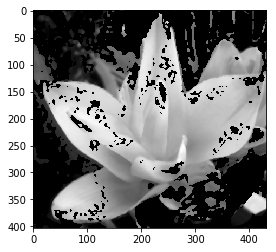

flower_category: 39
Petals count Algorithm started...
Number of Contours 154
Height 87, Width 129, Area 6562.0, extLeft: (34, 371), extRight: (162, 376), extTop: (102, 303), extBot: (115, 389), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 12867.963509103793, ellipse_area: 31587.15789425072, rect_area: 11223
Side 1: 96.16652224137046, Side 2: 61.68468205316454, Side 3: 50.80354318352215
Triangle Area: 1393.9999999999998, Chosen Area for petals count: Circle, Area: 6562.0, petals: 5
flower_name:  'siam tulip'
Petal count Algorithm Ended.


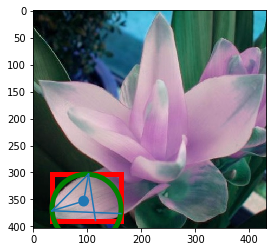

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 79,95,50  , HSI 80.53079810091224,0.3303571428571428,0.29281045751633983
[42, 43, 44, 45, 35, 42, 43, 44, 45, 46, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51, 57, 44, 45, 46, 47, 48, 49, 138, 140, 141, 142, 145]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


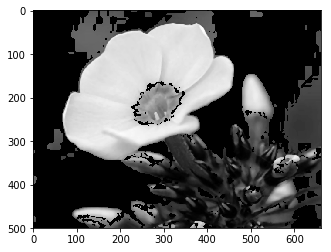

flower_category: 32
Petals count Algorithm started...
Number of Contours 77
Height 326, Width 394, Area 83720.0, extLeft: (68, 259), extRight: (461, 130), extTop: (315, 29), extBot: (271, 354), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 135917.8645649088, ellipse_area: 341283.3632636642, rect_area: 128444
Side 1: 337.50407404948464, Side 2: 202.97044119772713, Side 3: 166.43316977093238
Triangle Area: 12596.000000000013, Chosen Area for petals count: Circle, Area: 83720.0, petals: 7
flower_name:  'garden phlox'
Petal count Algorithm Ended.


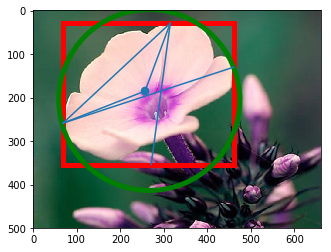

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 88,62,29  , HSI 33.91859296065983,0.5139664804469274,0.23398692810457516
[11, 12, 13, 14, 15, 16, 17, 12, 13, 14, 15, 13, 14, 15, 16, 15, 16, 17, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 59]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


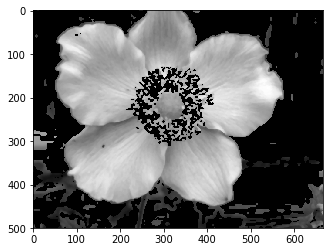

flower_category: 62
Petals count Algorithm started...
Number of Contours 77
Height 193, Width 403, Area 49541.5, extLeft: (78, 336), extRight: (480, 360), extTop: (241, 257), extBot: (418, 449), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 126923.48479768123, ellipse_area: 230657.65760456838, rect_area: 77779
Side 1: 181.13530854032848, Side 2: 204.1886382735337, Side 3: 108.63240768757728
Triangle Area: 9811.5, Chosen Area for petals count: Circle, Area: 49541.5, petals: 6
flower_name:  'japanese anemone'
Petal count Algorithm Ended.


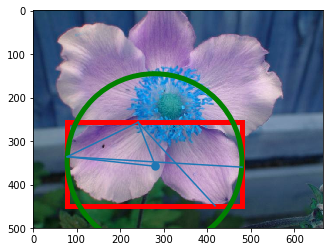

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 4,2,3  , HSI 330.0,0.33333333333333337,0.011764705882352941
[165, 165, 165, 165]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


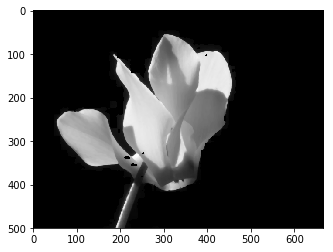

flower_category: 88
Petals count Algorithm started...
Number of Contours 12
Height 310, Width 403, Area 54252.5, extLeft: (54, 262), extRight: (456, 162), extTop: (301, 55), extBot: (292, 364), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 135917.8645649088, ellipse_area: 277615.2943152806, rect_area: 124930
Side 1: 322.2700730753633, Side 2: 213.17832910500073, Side 3: 169.31922513406445
Triangle Area: 16444.500000000007, Chosen Area for petals count: Circle, Area: 54252.5, petals: 4
flower_name:  'cyclamen '
Petal count Algorithm Ended.


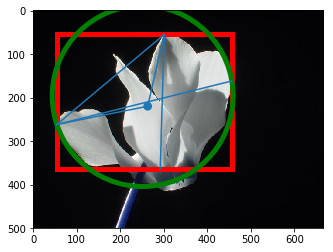

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 10,9,7  , HSI 40.89339464913091,0.1923076923076923,0.03398692810457516
[6, 13, 19, 20, 6, 13, 19, 20, 48, 49, 50, 51, 52, 53, 0, 5, 6, 15, 20, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 13, 19, 45, 46, 47, 48, 49, 50]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


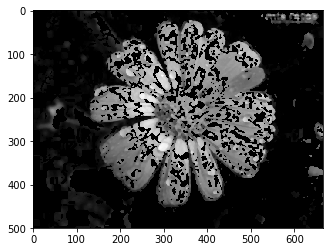

flower_category: 5
Petals count Algorithm started...
Number of Contours 202
Height 73, Width 90, Area 3545.0, extLeft: (202, 216), extRight: (291, 211), extTop: (237, 175), extBot: (226, 247), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 6361.725123519332, ellipse_area: 15474.824178035627, rect_area: 6570
Side 1: 53.907327887774215, Side 2: 44.40720662234904, Side 3: 36.138621999185304
Triangle Area: 796.9999999999995, Chosen Area for petals count: Circle, Area: 3545.0, petals: 5
flower_name:  'english marigold'
Petal count Algorithm Ended.


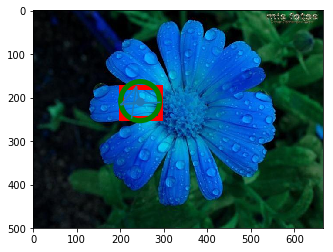

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 26,62,16  , HSI 108.07297581820141,0.5384615384615384,0.13594771241830064
[45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 37, 38, 39, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 24, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 55, 56, 57, 58, 60, 62, 65, 66, 67, 68, 69, 71]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


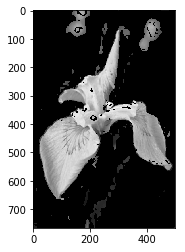

flower_category: 15
Petals count Algorithm started...
Number of Contours 95
Height 589, Width 455, Area 73191.5, extLeft: (23, 476), extRight: (477, 541), extTop: (301, 69), extBot: (91, 657), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 307778.6906795384, ellipse_area: 664788.539836221, rect_area: 267995
Side 1: 492.8823389004723, Side 2: 203.9730374338726, Side 3: 354.1073283624613
Triangle Area: 30721.999999999996, Chosen Area for petals count: Circle, Area: 73191.5, petals: 3
flower_name:  'yellow iris'
Petal count Algorithm Ended.


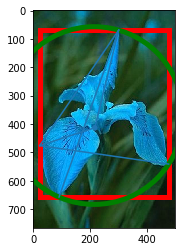

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 11,30,37  , HSI 195.0791379176578,0.5769230769230769,0.10196078431372547
[98, 101, 102, 103, 98, 101, 102, 103, 105, 98, 99, 100, 105]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


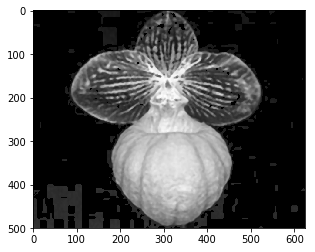

flower_category: 2
Petals count Algorithm started...
Number of Contours 134
Height 402, Width 302, Area 64048.5, extLeft: (155, 177), extRight: (456, 347), extTop: (321, 79), extBot: (318, 480), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 125663.70614359173, ellipse_area: 307891.8330731142, rect_area: 121404
Side 1: 192.76929216034384, Side 2: 209.990475974507, Side 3: 234.07691043757393
Triangle Area: 19127.999999999993, Chosen Area for petals count: Circle, Area: 64048.5, petals: 4
flower_name:  'hard-leaved pocket orchid'
Petal count Algorithm Ended.


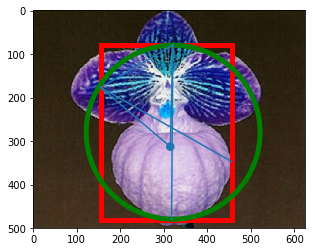

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 20,48,8  , HSI 103.00391194282281,0.6842105263157895,0.09934640522875816
[0, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 60, 0, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 60, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 0, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 60]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


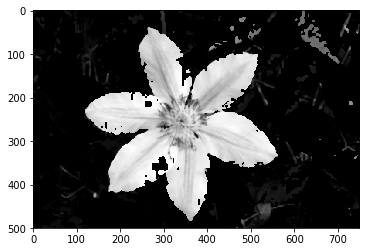

flower_category: 82
Petals count Algorithm started...
Number of Contours 63
Height 448, Width 446, Area 92303.0, extLeft: (118, 235), extRight: (563, 333), extTop: (264, 38), extBot: (361, 485), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 169093.08298681703, ellipse_area: 432484.9358382227, rect_area: 199808
Side 1: 245.20399670478457, Side 2: 222.40953216982405, Side 3: 234.3266950221421
Triangle Area: 23593.499999999993, Chosen Area for petals count: Circle, Area: 92303.0, petals: 4
flower_name:  'clematis'
Petal count Algorithm Ended.


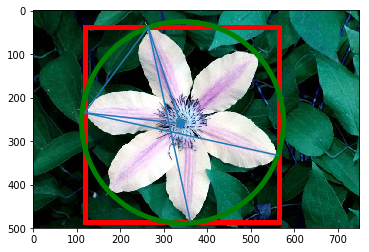

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 18,28,17  , HSI 115.2849960460518,0.19047619047619047,0.08235294117647059
[34, 35, 34, 35, 39, 40, 42, 43, 45, 46, 48, 45, 46, 48, 49, 57, 34, 35, 38, 39, 40, 41, 42, 43, 45, 46, 48, 49, 176]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


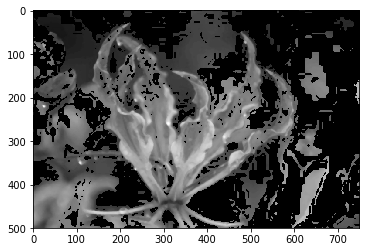

flower_category: 21
Petals count Algorithm started...
Number of Contours 75
Height 19, Width 139, Area 1056.0, extLeft: (114, 459), extRight: (252, 454), extTop: (244, 452), extBot: (165, 470), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 14957.122623741005, ellipse_area: 7856.327089162573, rect_area: 2641
Side 1: 130.18832512940628, Side 2: 67.06713054842886, Side 3: 63.788713735268246
Triangle Area: 429.4999999999919, Chosen Area for petals count: Circle, Area: 1056.0, petals: 3
flower_name:  'fire lily'
Petal count Algorithm Ended.


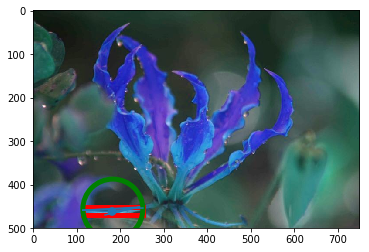

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 1,1,1  , HSI 0.0,0.0,0.00392156862745098
[0, 0, 0, 120, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


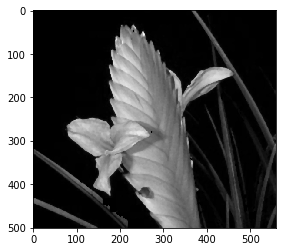

flower_category: 93
Petals count Algorithm started...
Number of Contours 97
Height 158, Width 98, Area 6868.5, extLeft: (176, 171), extRight: (273, 238), extTop: (177, 170), extBot: (183, 327), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 20106.192982974677, ellipse_area: 39231.33517958408, rect_area: 15484
Side 1: 1.4142135623730951, Side 2: 86.09297300012354, Side 3: 86.45229898620394
Triangle Area: 58.999999999999936, Chosen Area for petals count: Circle, Area: 6868.5, petals: 117
flower_name:  'ball moss'
Petal count Algorithm Ended.


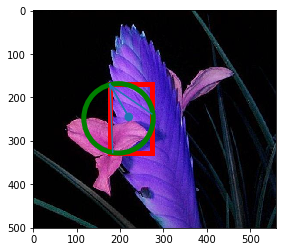

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 46,76,50  , HSI 127.05267702726154,0.19767441860465118,0.22483660130718952
[23, 24, 25, 26, 44, 45, 46, 47, 48, 50, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 43, 44, 45, 46, 47, 48, 50, 17, 18, 19, 20, 21, 22, 45, 46, 47, 48, 49, 50, 51, 18, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


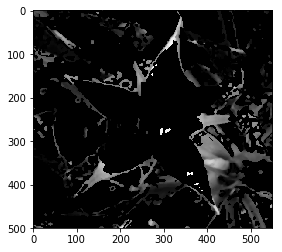

flower_category: 99
Petals count Algorithm started...
Number of Contours 48
Height 43, Width 52, Area 824.0, extLeft: (141, 375), extRight: (192, 374), extTop: (154, 346), extBot: (162, 388), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 2123.7166338267, ellipse_area: 4987.884116090332, rect_area: 2236
Side 1: 31.78049716414141, Side 2: 19.6468827043885, Side 3: 24.73863375370596
Triangle Area: 243.00000000000017, Chosen Area for petals count: Circle, Area: 824.0, petals: 4
flower_name:  'bromelia'
Petal count Algorithm Ended.


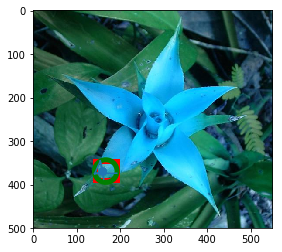

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 61,85,61  , HSI 120.00000000000001,0.11594202898550743,0.27058823529411763
[0, 30, 50, 0, 30, 50, 30, 46, 50, 55, 57, 60, 66, 70, 100, 101, 0, 59, 61, 63]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


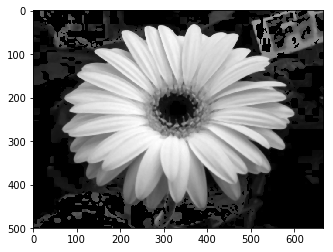

flower_category: 41
Petals count Algorithm started...
Number of Contours 40
Height 404, Width 530, Area 113521.0, extLeft: (69, 273), extRight: (598, 235), extTop: (365, 32), extBot: (323, 435), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 220618.34409834322, ellipse_area: 488143.7294638973, rect_area: 214120
Side 1: 381.7027639407396, Side 2: 264.3671689147501, Side 3: 191.60636732634956
Triangle Area: 23365.499999999996, Chosen Area for petals count: Circle, Area: 113521.0, petals: 5
flower_name:  'barbeton daisy'
Petal count Algorithm Ended.


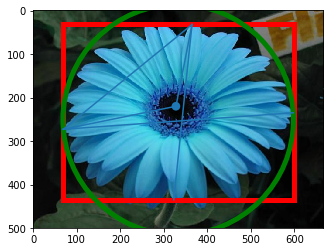

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 60,91,47  , HSI 103.28907970642553,0.28787878787878785,0.2588235294117647
[71, 77, 80, 85, 86, 87, 69, 70, 71, 72, 73, 75, 77, 80, 85, 86, 87, 103, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 80, 90, 95, 103, 109, 74, 77, 80, 86, 87, 90, 103]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


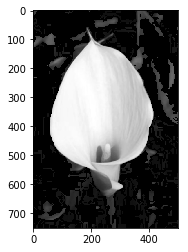

flower_category: 20
Petals count Algorithm started...
Number of Contours 3
Height 548, Width 360, Area 119919.5, extLeft: (57, 420), extRight: (416, 353), extTop: (191, 73), extBot: (287, 620), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 241051.26271729125, ellipse_area: 501844.9106441498, rect_area: 197280
Side 1: 371.9744614889576, Side 2: 191.2694434560837, Side 3: 280.4728150819612
Triangle Area: 26193.000000000015, Chosen Area for petals count: Circle, Area: 119919.5, petals: 5
flower_name:  'giant white arum lily'
Petal count Algorithm Ended.


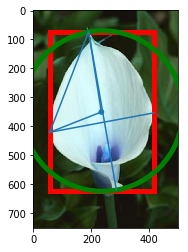

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 14,20,18  , HSI 160.8933946491309,0.1923076923076923,0.06797385620915032
[0, 30, 170, 0, 30, 170, 0, 46, 47, 48, 49, 0, 24, 30, 36, 66, 70, 72, 170, 174, 177]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


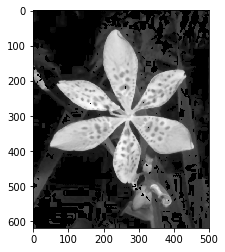

flower_category: 102
Petals count Algorithm started...
Number of Contours 39
Height 457, Width 411, Area 71819.0, extLeft: (47, 385), extRight: (457, 385), extTop: (234, 54), extBot: (288, 510), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 166190.25137490008, ellipse_area: 410456.11753120745, rect_area: 187827
Side 1: 380.1710141502111, Side 2: 231.32012450281968, Side 3: 235.1276249188938
Triangle Area: 25685.5, Chosen Area for petals count: Circle, Area: 71819.0, petals: 3
flower_name:  'blackberry lily'
Petal count Algorithm Ended.


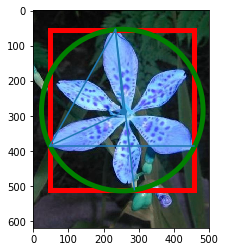

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 55,45,35  , HSI 29.999999999999993,0.23255813953488358,0.1814345991561181
[11, 12, 14, 15, 17, 11, 12, 13, 14, 15, 17, 12, 14, 15, 16, 17, 19, 22, 23, 26, 27, 15, 16, 17, 18, 19, 20, 21, 22, 24, 27, 28, 33, 34, 35, 36, 37, 152]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


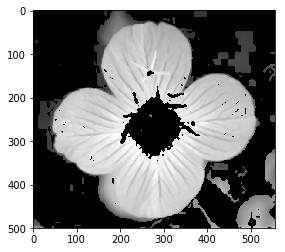

flower_category: 1
Petals count Algorithm started...
Number of Contours 58
Height 453, Width 470, Area 130670.0, extLeft: (44, 273), extRight: (513, 250), extTop: (262, 27), extBot: (275, 479), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 173494.45429449633, ellipse_area: 544844.2558924523, rect_area: 212910
Side 1: 328.69438693108225, Side 2: 231.48650068632512, Side 3: 231.36551169091732
Triangle Area: 26777.999999999996, Chosen Area for petals count: Circle, Area: 130670.0, petals: 5
flower_name:  'pink primrose'
Petal count Algorithm Ended.


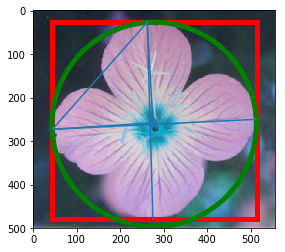

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 71,59,47  , HSI 29.999999999999993,0.20338983050847448,0.23137254901960783
[0, 3, 5, 8, 9, 11, 13, 19, 0, 3, 5, 6, 8, 11, 13, 19, 21, 26, 35, 177, 16, 21, 26, 30, 32, 34, 35, 37, 38, 42, 43, 44, 45, 46, 48, 51, 55, 0, 5, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24, 26, 29, 30, 32, 33, 34, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 48]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


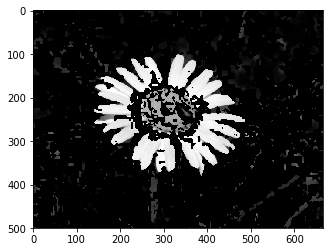

flower_category: 49
Petals count Algorithm started...
Number of Contours 60
Height 146, Width 156, Area 9676.0, extLeft: (332, 294), extRight: (487, 252), extTop: (409, 235), extBot: (387, 380), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 22698.006922186254, ellipse_area: 46596.707651751596, rect_area: 22776
Side 1: 97.0051545022222, Side 2: 74.02702209328699, Side 3: 61.07372593840988
Triangle Area: 2259.999999999999, Chosen Area for petals count: Circle, Area: 9676.0, petals: 5
flower_name:  'oxeye daisy'
Petal count Algorithm Ended.


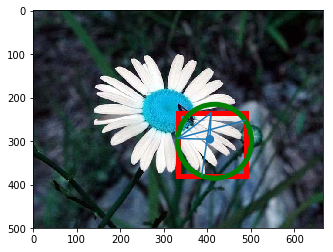

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 34,88,10  , HSI 102.51982979723964,0.7727272727272727,0.1725490196078431
[48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 65, 66, 16, 21, 30, 43, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 47, 48, 49, 50, 51, 52, 17, 18, 19, 20, 22, 30, 43, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 66]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


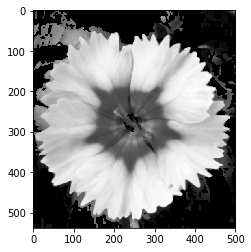

flower_category: 30
Petals count Algorithm started...
Number of Contours 20
Height 232, Width 251, Area 29999.5, extLeft: (121, 321), extRight: (371, 316), extTop: (239, 173), extBot: (235, 404), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 53912.87152825444, ellipse_area: 139004.35101408788, rect_area: 58232
Side 1: 189.2828571212935, Side 2: 125.54282137979854, Side 3: 108.00462953040486
Triangle Area: 6446.000000000001, Chosen Area for petals count: Circle, Area: 29999.5, petals: 5
flower_name:  'sweet william'
Petal count Algorithm Ended.


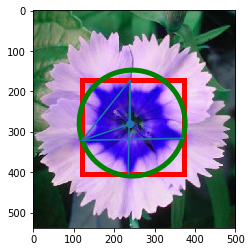

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 28,29,15  , HSI 63.67049650831512,0.375,0.09411764705882353
[24, 26, 30, 32, 34, 35, 36, 37, 38, 39, 40, 38, 110, 114, 35, 110, 23, 26, 30, 37, 38, 114]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


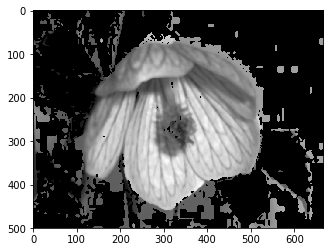

flower_category: 97
Petals count Algorithm started...
Number of Contours 90
Height 398, Width 422, Area 68371.0, extLeft: (123, 367), extRight: (544, 242), extTop: (335, 62), extBot: (309, 459), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 156228.26107036683, ellipse_area: 382031.22465684806, rect_area: 167956
Side 1: 371.44178547923224, Side 2: 221.0814329607984, Side 3: 239.00209204105306
Triangle Area: 25181.5, Chosen Area for petals count: Circle, Area: 68371.0, petals: 3
flower_name:  'mallow'
Petal count Algorithm Ended.


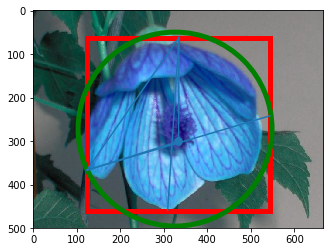

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 31,38,4  , HSI 71.2415980856976,0.8356164383561644,0.09542483660130718
[26, 33, 35, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 55, 56, 57, 59, 62, 34, 35, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 61, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 64, 34, 35, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 51]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


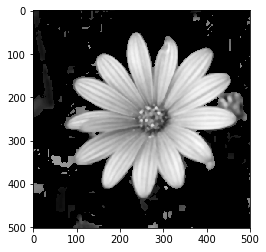

flower_category: 66
Petals count Algorithm started...
Number of Contours 31
Height 380, Width 390, Area 77196.0, extLeft: (78, 265), extRight: (467, 246), extTop: (234, 52), extBot: (255, 431), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 128189.54663707792, ellipse_area: 324108.35766458395, rect_area: 148200
Side 1: 264.0170449043016, Side 2: 195.86985475054604, Side 3: 189.84203960134857
Triangle Area: 18555.0, Chosen Area for petals count: Circle, Area: 77196.0, petals: 5
flower_name:  'osteospermum'
Petal count Algorithm Ended.


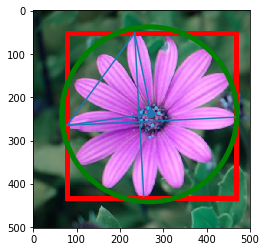

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 67,118,61  , HSI 114.5036334553454,0.25609756097561,0.3215686274509804
[43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 65, 66, 67, 68, 69, 70, 22, 23, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 67, 68, 69, 70, 15, 16, 17, 18, 19, 20, 22, 23, 24, 25, 28, 36, 37, 39, 42, 43, 44, 45, 46, 47, 48, 49, 59, 61, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


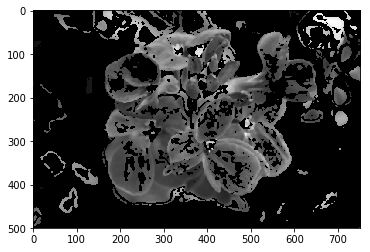

flower_category: 46
Petals count Algorithm started...
Number of Contours 169
Height 132, Width 241, Area 8232.0, extLeft: (213, 11), extRight: (453, 50), extTop: (220, 7), extBot: (328, 138), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 45996.05804120816, ellipse_area: 81330.55529518596, rect_area: 31812
Side 1: 8.06225774829855, Side 2: 117.04699910719626, Side 3: 113.6001760562016
Triangle Area: 419.9999999999999, Chosen Area for petals count: Circle, Area: 8232.0, petals: 20
flower_name:  'wallflower'
Petal count Algorithm Ended.


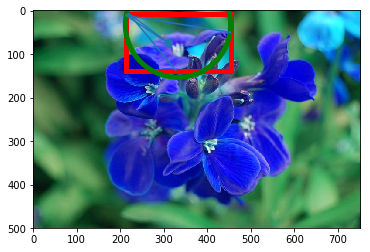

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 10,19,0  , HSI 88.25949695526651,1.0,0.03790849673202614
[39, 40, 41, 42, 43, 44, 45, 46, 39, 40, 41, 42, 43, 44, 45, 46, 39, 40, 41, 42, 43, 44, 39, 40, 41, 42, 43, 44, 45]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


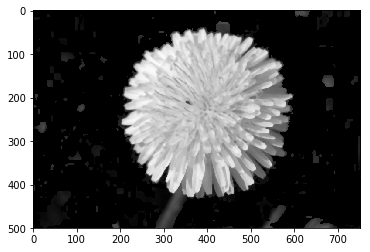

flower_category: 50
Petals count Algorithm started...
Number of Contours 48
Height 388, Width 393, Area 94357.0, extLeft: (202, 259), extRight: (594, 196), extTop: (389, 42), extBot: (365, 429), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 126923.48479768123, ellipse_area: 388119.3191629428, rect_area: 152484
Side 1: 286.457675756821, Side 2: 181.4083790788066, Side 3: 182.22239159883728
Triangle Area: 16040.500000000005, Chosen Area for petals count: Circle, Area: 94357.0, petals: 6
flower_name:  'common dandelion'
Petal count Algorithm Ended.


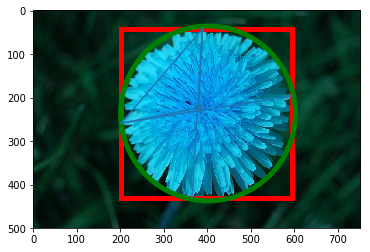

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 68,106,83  , HSI 143.0698403183189,0.20622568093385207,0.3359477124183006
[0, 1, 2, 56, 57, 64, 65, 66, 68, 69, 71, 73, 74, 75, 77, 0, 1, 2, 50, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 73, 74, 75, 77, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 68, 0, 1, 2, 43, 48, 50, 51, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 74, 80]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


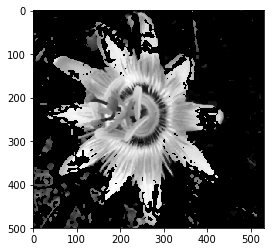

flower_category: 77
Petals count Algorithm started...
Number of Contours 136
Height 448, Width 372, Area 71754.0, extLeft: (45, 242), extRight: (416, 221), extTop: (158, 47), extBot: (275, 494), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 167638.52558820497, ellipse_area: 336903.24470801756, rect_area: 166656
Side 1: 225.37524265100637, Side 2: 191.1674658512792, Side 3: 217.46953809671828
Triangle Area: 19074.50000000001, Chosen Area for petals count: Circle, Area: 71754.0, petals: 4
flower_name:  'passion flower'
Petal count Algorithm Ended.


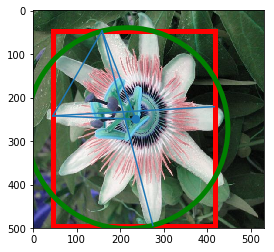

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 65,81,10  , HSI 72.40430119807304,0.8076923076923077,0.20392156862745095
[34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 0, 1, 26, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 179, 6, 8, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 0, 1, 5, 39, 40, 41, 42, 43, 44, 45, 46, 177, 179]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


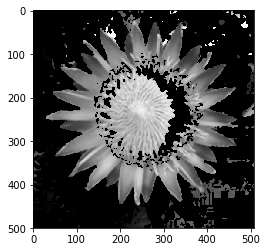

flower_category: 13
Petals count Algorithm started...
Number of Contours 196
Height 385, Width 279, Area 49546.0, extLeft: (49, 244), extRight: (327, 241), extTop: (229, 64), extBot: (242, 448), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 125663.70614359173, ellipse_area: 228098.58671930456, rect_area: 107415
Side 1: 254.55844122715712, Side 2: 155.05160431288675, Side 3: 185.6906028855526
Triangle Area: 14310.000000000002, Chosen Area for petals count: Circle, Area: 49546.0, petals: 4
flower_name:  'king protea'
Petal count Algorithm Ended.


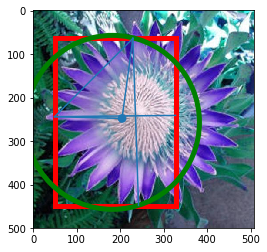

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 35,60,30  , HSI 111.0517244353729,0.28000000000000014,0.16339869281045752
[39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 62, 63, 64, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 72, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 61, 62, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 71, 73, 75]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


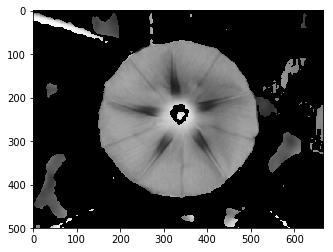

flower_category: 76
Petals count Algorithm started...
Number of Contours 85
Height 104, Width 141, Area 7571.0, extLeft: (241, 294), extRight: (381, 248), extTop: (312, 200), extBot: (258, 303), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 16741.547250980006, ellipse_area: 38665.365406251156, rect_area: 14664
Side 1: 117.80067911519016, Side 2: 91.706052144883, Side 3: 51.97114584074513
Triangle Area: 2280.500000000002, Chosen Area for petals count: Circle, Area: 7571.0, petals: 4
flower_name:  'morning glory'
Petal count Algorithm Ended.


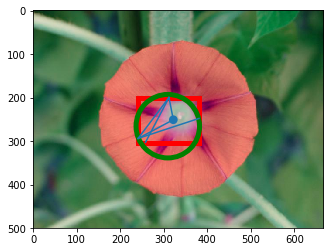

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 1,1,1  , HSI 0.0,0.0,0.00392156862745098
[0, 35, 36, 37, 32, 33, 34, 35, 36, 37, 0, 34, 35, 37, 34, 35, 36, 37]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


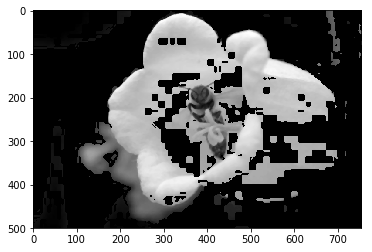

flower_category: 3
Petals count Algorithm started...
Number of Contours 59
Height 444, Width 522, Area 140184.5, extLeft: (172, 254), extRight: (693, 202), extTop: (339, 6), extBot: (321, 449), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 230721.70607228798, ellipse_area: 634592.0840723091, rect_area: 231768
Side 1: 298.9866217742861, Side 2: 234.5591609807641, Side 3: 230.6447484769597
Triangle Area: 26637.49999999998, Chosen Area for petals count: Circle, Area: 140184.5, petals: 6
flower_name:  'canterbury bells'
Petal count Algorithm Ended.


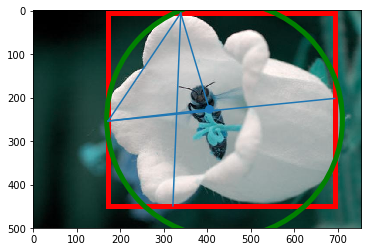

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 58,92,42  , HSI 101.74153099589083,0.34375,0.25098039215686274
[50, 51, 52, 53, 54, 55, 56, 57, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 44, 46, 47, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 58]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


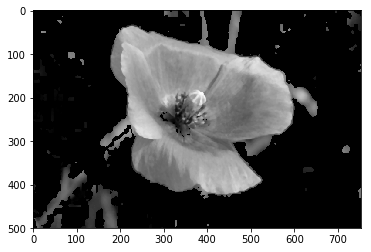

flower_category: 26
Petals count Algorithm started...
Number of Contours 45
Height 388, Width 406, Area 53115.0, extLeft: (191, 287), extRight: (596, 216), extTop: (226, 35), extBot: (443, 422), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 174974.14443433713, ellipse_area: 370629.5806095261, rect_area: 157528
Side 1: 254.41894583540747, Side 2: 197.61831898890347, Side 3: 228.5475880424031
Triangle Area: 21584.500000000007, Chosen Area for petals count: Circle, Area: 53115.0, petals: 3
flower_name:  'corn poppy'
Petal count Algorithm Ended.


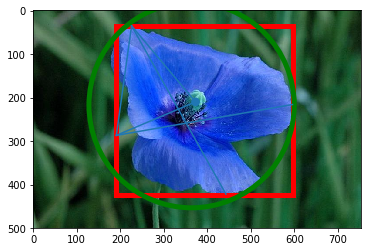

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 0,0,0  , HSI 0.0,0.0,0.0
[0, 0, 0, 60, 0, 59, 60]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


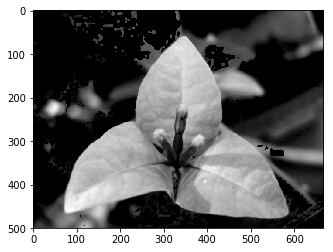

flower_category: 95
Petals count Algorithm started...
Number of Contours 54
Height 223, Width 289, Area 27707.0, extLeft: (235, 226), extRight: (523, 185), extTop: (342, 59), extBot: (363, 281), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 66051.9855417254, ellipse_area: 138200.2516758608, rect_area: 64447
Side 1: 198.33809518093088, Side 2: 127.91012469699183, Side 3: 111.28791488746656
Triangle Area: 6606.499999999998, Chosen Area for petals count: Circle, Area: 27707.0, petals: 5
flower_name:  'bougainvillea'
Petal count Algorithm Ended.


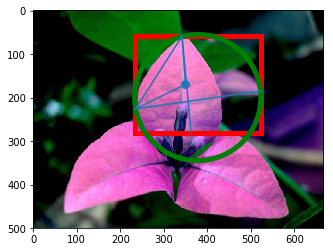

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 99,98,77  , HSI 57.69335856879814,0.15693430656934315,0.3581699346405228
[16, 19, 20, 21, 22, 23, 25, 26, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 50, 8, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 0, 5, 6, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 150, 6, 8, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 24, 25, 26, 30, 32, 33, 34, 35, 36, 38, 39, 40, 41, 42, 43, 44]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


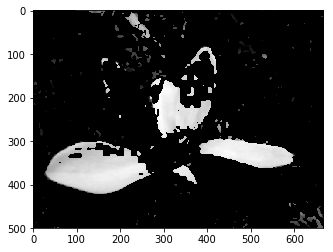

flower_category: 87
Petals count Algorithm started...
Number of Contours 59
Height 122, Width 243, Area 19011.5, extLeft: (28, 374), extRight: (270, 376), extTop: (147, 300), extBot: (164, 421), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 45996.05804120816, ellipse_area: 79318.27230020196, rect_area: 29646
Side 1: 140.13208055259867, Side 2: 114.5294721894762, Side 3: 63.198101237299845
Triangle Area: 3563.499999999998, Chosen Area for petals count: Circle, Area: 19011.5, petals: 6
flower_name:  'magnolia'
Petal count Algorithm Ended.


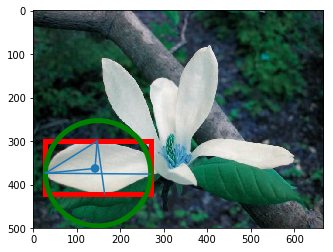

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 121,89,68  , HSI 23.166974843051086,0.26618705035971213,0.36339869281045745
[15, 16, 17, 18, 19, 20, 21, 22, 24, 13, 15, 16, 17, 18, 19, 20, 21, 22, 24, 26, 30, 35, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 26, 11, 13, 14, 15, 16, 17, 18, 19, 20, 22, 46]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


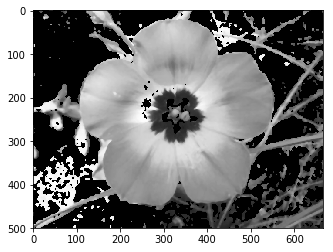

flower_category: 45
Petals count Algorithm started...
Number of Contours 184
Height 221, Width 647, Area 60185.0, extLeft: (19, 498), extRight: (665, 499), extTop: (530, 279), extBot: (19, 499), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 361034.9693431926, ellipse_area: 440407.04042313364, rect_area: 142987
Side 1: 555.9514367280653, Side 2: 432.2244787144754, Side 3: 173.6663467687393
Triangle Area: 29638.0, Chosen Area for petals count: Circle, Area: 60185.0, petals: 3
flower_name:  'bolero deep blue'
Petal count Algorithm Ended.


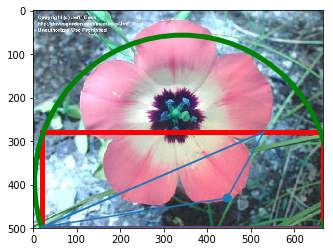

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 19,41,20  , HSI 122.30664143120184,0.2875000000000001,0.1045751633986928
[48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 67, 22, 23, 35, 43, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 67, 35, 38, 39, 40, 43, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 57, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


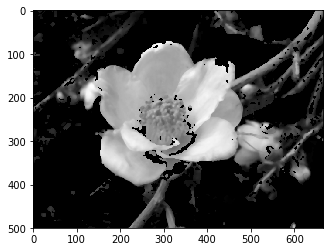

flower_category: 96
Petals count Algorithm started...
Number of Contours 104
Height 330, Width 478, Area 86337.0, extLeft: (107, 194), extRight: (584, 86), extTop: (304, 71), extBot: (240, 400), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 199503.69987356622, ellipse_area: 424659.174920047, rect_area: 157740
Side 1: 232.24555969921147, Side 2: 214.94650497274898, Side 3: 164.59647626847908
Triangle Area: 17015.000000000007, Chosen Area for petals count: Circle, Area: 86337.0, petals: 6
flower_name:  'camellia'
Petal count Algorithm Ended.


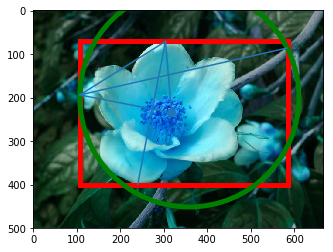

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 157,125,76  , HSI 36.908977355821015,0.36312849162011185,0.47354497354497355
[87, 90, 93, 95, 96, 98, 99, 101, 103, 87, 90, 93, 95, 96, 98, 101, 103, 114, 120, 126, 87, 90, 96, 101, 103, 110, 120, 126, 140, 101, 103, 109, 113, 114, 126]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


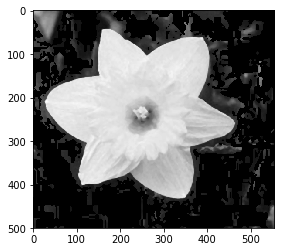

flower_category: 42
Petals count Algorithm started...
Number of Contours 8
Height 391, Width 438, Area 100189.0, extLeft: (26, 211), extRight: (463, 258), extTop: (164, 42), extBot: (344, 432), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 153438.52679397908, ellipse_area: 428624.6480842275, rect_area: 171258
Side 1: 218.1857007230309, Side 2: 222.29934772733816, Side 3: 210.09045670853305
Triangle Area: 20330.50000000001, Chosen Area for petals count: Circle, Area: 100189.0, petals: 5
flower_name:  'daffodil'
Petal count Algorithm Ended.


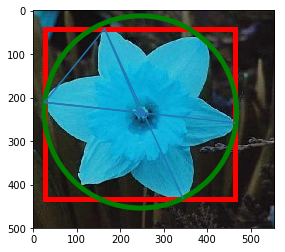

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 101,136,34  , HSI 79.73335425332034,0.6236162361623616,0.35424836601307186
[37, 38, 39, 40, 41, 42, 43, 44, 45, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 39, 40, 41, 44, 45, 46, 41, 42, 44, 45, 46, 47]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


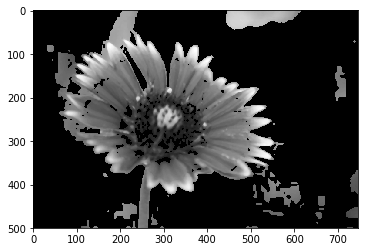

flower_category: 100
Petals count Algorithm started...
Number of Contours 44
Height 148, Width 198, Area 6145.0, extLeft: (322, 104), extRight: (519, 179), extTop: (330, 72), extBot: (483, 219), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 37325.26231730033, ellipse_area: 38757.416420393245, rect_area: 29304
Side 1: 32.984845004941285, Side 2: 100.72239075796404, Side 3: 111.28791488746656
Triangle Area: 1636.0000000000011, Chosen Area for petals count: Circle, Area: 6145.0, petals: 4
flower_name:  'blanket flower'
Petal count Algorithm Ended.


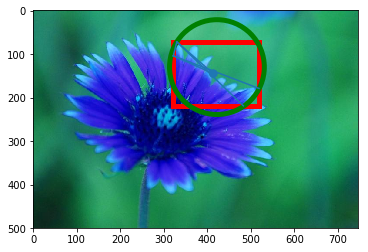

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 134,233,116  , HSI 111.78678929826181,0.2795031055900621,0.6313725490196078
[50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 50, 51, 52, 53, 54, 55, 56, 57, 61, 53, 54, 55, 56, 57, 58, 59, 60, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


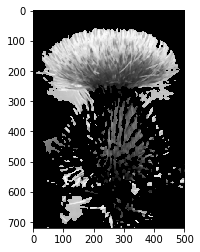

flower_category: 14
Petals count Algorithm started...
Number of Contours 154
Height 291, Width 475, Area 62513.0, extLeft: (9, 208), extRight: (483, 195), extTop: (205, 58), extBot: (146, 348), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 176460.1177594851, ellipse_area: 340230.8726609089, rect_area: 138225
Side 1: 246.81166909204273, Side 2: 229.83689869122406, Side 3: 118.1397477566293
Triangle Area: 13496.999999999995, Chosen Area for petals count: Circle, Area: 62513.0, petals: 5
flower_name:  'spear thistle'
Petal count Algorithm Ended.


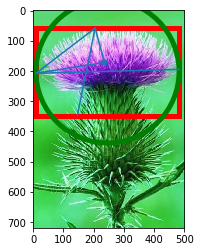

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 153,151,154  , HSI 280.89339464913087,0.012106537530266248,0.5736111111111111
[0, 30, 107, 0, 30, 0, 24, 30, 36, 120, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


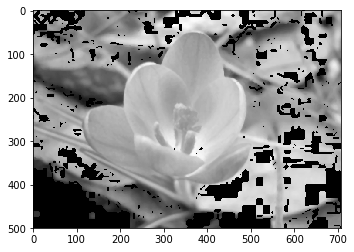

flower_category: 67
Petals count Algorithm started...
Number of Contours 196
Height 188, Width 552, Area 49540.5, extLeft: (0, 337), extRight: (551, 477), extTop: (76, 312), extBot: (0, 499), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 256969.7126930307, ellipse_area: 285621.6650594702, rect_area: 103776
Side 1: 80.00624975587844, Side 2: 220.06589922111968, Side 3: 174.04022523543227
Triangle Area: 6313.499999999996, Chosen Area for petals count: Circle, Area: 49540.5, petals: 8
flower_name:  'spring crocus'
Petal count Algorithm Ended.


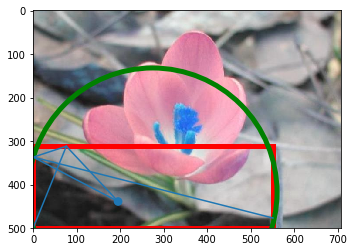

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 34,45,31  , HSI 108.25846900410919,0.15454545454545465,0.1437908496732026
[38, 40, 43, 46, 48, 50, 51, 52, 53, 54, 55, 56, 57, 66, 40, 42, 43, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 34, 35, 43, 45, 46, 47, 48, 49, 50, 51, 52, 42, 43, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 60]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


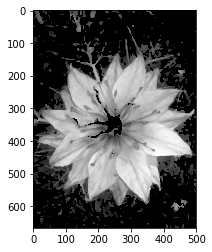

flower_category: 33
Petals count Algorithm started...
Number of Contours 67
Height 458, Width 486, Area 128687.0, extLeft: (10, 339), extRight: (495, 303), extTop: (328, 139), extBot: (265, 596), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 190116.62102463993, ellipse_area: 543200.6508501298, rect_area: 222588
Side 1: 375.66474415361364, Side 2: 245.48930730278255, Side 3: 238.75719884434898
Triangle Area: 28693.000000000015, Chosen Area for petals count: Circle, Area: 128687.0, petals: 5
flower_name:  'love in the mist'
Petal count Algorithm Ended.


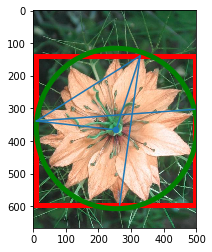

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 49,71,92  , HSI 209.23075009081413,0.30660377358490565,0.2771241830065359
[85, 94, 100, 101, 102, 85, 94, 100, 101, 102, 103, 103, 105, 80, 82, 83, 84, 85, 86, 87, 89]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


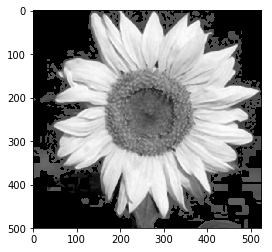

flower_category: 54
Petals count Algorithm started...
Number of Contours 33
Height 473, Width 471, Area 101355.5, extLeft: (47, 266), extRight: (517, 185), extTop: (200, 1), extBot: (302, 473), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 199503.69987356622, ellipse_area: 513934.3544011799, rect_area: 222783
Side 1: 305.9967320086932, Side 2: 235.95126615468712, Side 3: 235.63743335896356
Triangle Area: 27450.500000000007, Chosen Area for petals count: Circle, Area: 101355.5, petals: 4
flower_name:  'sunflower'
Petal count Algorithm Ended.


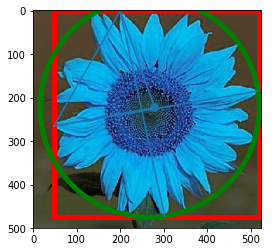

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 39,55,42  , HSI 130.158329786242,0.13970588235294112,0.17777777777777776
[58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 72, 74, 76, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 70, 71, 72, 74, 76, 80, 170, 48, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 62, 63, 65, 66, 67, 69, 70, 74, 80, 170, 30, 55, 59, 60, 62, 63, 64, 65, 66, 67, 69, 70, 72]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


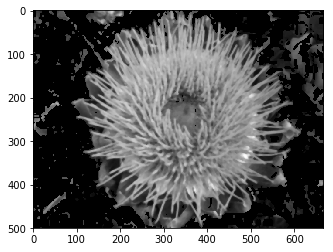

flower_category: 29
Petals count Algorithm started...
Number of Contours 207
Height 479, Width 482, Area 97213.0, extLeft: (92, 212), extRight: (573, 276), extTop: (360, 11), extBot: (385, 489), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 185507.9046018237, ellipse_area: 470359.3684551223, rect_area: 230878
Side 1: 335.0, Side 2: 243.6657546722559, Side 3: 220.42232191862965
Triangle Area: 26833.499999999993, Chosen Area for petals count: Circle, Area: 97213.0, petals: 4
flower_name:  'artichoke'
Petal count Algorithm Ended.


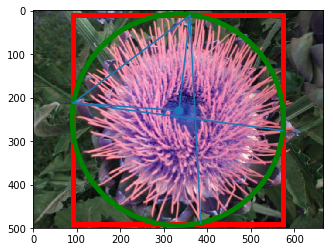

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 41,37,26  , HSI 45.0791379176578,0.2499999999999999,0.13594771241830064
[11, 48, 51, 55, 56, 57, 60, 62, 63, 67, 0, 3, 5, 8, 11, 13, 30, 56, 60, 63, 0, 3, 5, 6, 11, 13, 20, 24, 30, 36, 177, 30, 42, 50, 55, 60, 63, 66]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


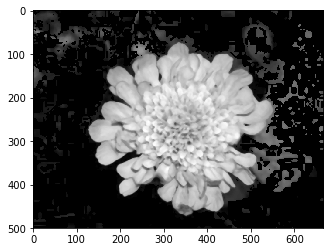

flower_category: 22
Petals count Algorithm started...
Number of Contours 120
Height 305, Width 413, Area 75618.5, extLeft: (130, 284), extRight: (542, 215), extTop: (323, 99), extBot: (347, 403), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 135917.8645649088, ellipse_area: 308173.25555515557, rect_area: 125965
Side 1: 267.34621747838514, Side 2: 219.14607000811125, Side 3: 149.77650015940418
Triangle Area: 16409.500000000004, Chosen Area for petals count: Circle, Area: 75618.5, petals: 5
flower_name:  'pincushion flower'
Petal count Algorithm Ended.


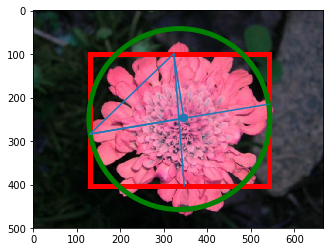

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 14,15,10  , HSI 70.89339464913091,0.23076923076923084,0.050980392156862744
[35, 36, 38, 34, 35, 36, 37, 38, 15, 16, 17, 18, 19, 22, 23, 24, 30, 31, 32, 33, 34, 35, 36, 30, 34, 35, 36, 38, 40, 43]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


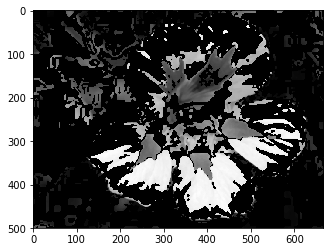

flower_category: 89
Petals count Algorithm started...
Number of Contours 168
Height 158, Width 170, Area 14155.5, extLeft: (321, 411), extRight: (490, 390), extTop: (434, 310), extBot: (452, 467), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 23778.714795021144, ellipse_area: 67589.72066278842, rect_area: 26860
Side 1: 151.5585695366646, Side 2: 86.49277426467485, Side 3: 89.49301648732151
Triangle Area: 3388.5000000000014, Chosen Area for petals count: Circle, Area: 14155.5, petals: 5
flower_name:  'watercress'
Petal count Algorithm Ended.


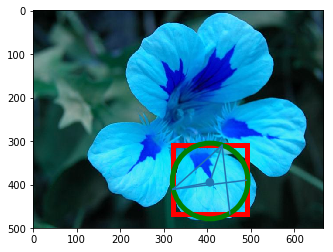

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 20,50,86  , HSI 213.00449159888308,0.6153846153846154,0.20392156862745098
[105, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 120, 61, 64, 65, 66, 67, 68, 69, 80, 87, 90, 94, 96, 98, 100, 101, 102, 103, 105, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 120, 60, 61, 62, 63, 64, 65, 66, 67, 68, 73, 74, 75, 76, 77, 78, 107, 108, 109, 110, 111, 80, 96, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 115, 116, 120]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


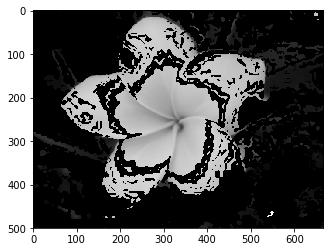

flower_category: 81
Petals count Algorithm started...
Number of Contours 226
Height 410, Width 470, Area 84800.0, extLeft: (63, 220), extRight: (532, 130), extTop: (275, 15), extBot: (382, 424), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 180955.73684677208, ellipse_area: 394421.9646583667, rect_area: 192700
Side 1: 294.9050694715165, Side 2: 249.0321264415497, Side 3: 204.37710243566914
Triangle Area: 25098.500000000004, Chosen Area for petals count: Circle, Area: 84800.0, petals: 4
flower_name:  'frangipani'
Petal count Algorithm Ended.


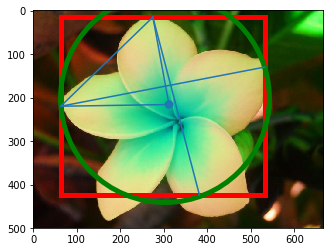

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 109,108,106  , HSI 40.893394649131004,0.015479876160990669,0.42222222222222217
[0, 20, 30, 35, 36, 38, 40, 66, 69, 71, 73, 75, 76, 80, 165, 173, 0, 35, 74, 75, 76, 77, 80, 83, 90, 165, 173, 30, 35, 80, 0, 35, 75, 80, 90, 170, 173, 174]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


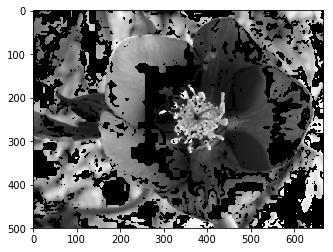

flower_category: 40
Petals count Algorithm started...
Number of Contours 326
Height 61, Width 132, Area 4340.5, extLeft: (221, 51), extRight: (352, 13), extTop: (239, 0), extBot: (244, 60), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 14957.122623741005, ellipse_area: 24395.391845773578, rect_area: 8052
Side 1: 54.08326913195984, Side 2: 63.56099432828282, Side 3: 47.16990566028302
Triangle Area: 1244.9999999999995, Chosen Area for petals count: Circle, Area: 4340.5, petals: 4
flower_name:  'lenten rose'
Petal count Algorithm Ended.


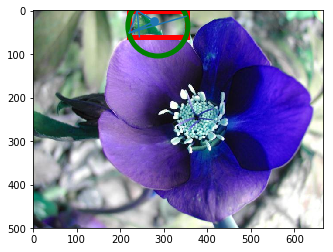

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 0,0,0  , HSI 0.0,0.0,0.0
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


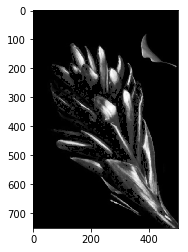

flower_category: 24
Petals count Algorithm started...
Number of Contours 73
Height 24, Width 94, Area 797.5, extLeft: (89, 450), extRight: (182, 465), extTop: (94, 446), extBot: (180, 469), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 6939.778171779853, ellipse_area: 3384.84847053694, rect_area: 2256
Side 1: 6.4031242374328485, Side 2: 46.69047011971501, Side 3: 42.720018726587654
Triangle Area: 111.99999999999973, Chosen Area for petals count: Circle, Area: 797.5, petals: 8
flower_name:  'red ginger'
Petal count Algorithm Ended.


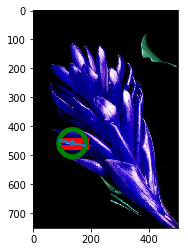

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 112,116,91  , HSI 68.565118337515,0.14420062695924762,0.41699346405228754
[17, 22, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 39, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 62, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


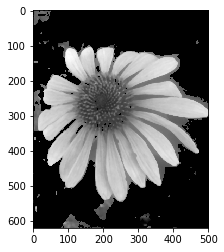

flower_category: 17
Petals count Algorithm started...
Number of Contours 41
Height 106, Width 198, Area 12564.0, extLeft: (215, 185), extRight: (412, 148), extTop: (268, 116), extBot: (274, 221), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 31415.926535897932, ellipse_area: 53324.549103487654, rect_area: 20988
Side 1: 87.00574693662483, Side 2: 97.01546268507923, Side 3: 60.876925020897694
Triangle Area: 2606.9999999999995, Chosen Area for petals count: Circle, Area: 12564.0, petals: 5
flower_name:  'purple coneflower'
Petal count Algorithm Ended.


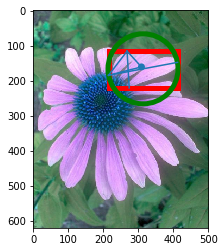

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 79,102,11  , HSI 74.06580319734248,0.828125,0.25098039215686274
[38, 39, 40, 41, 42, 43, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 40, 42, 46, 47, 48, 49, 50, 51, 34, 35, 36, 37, 38, 39, 45, 46, 47, 48, 49, 50, 51]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


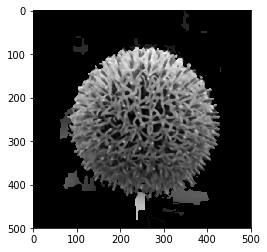

flower_category: 10
Petals count Algorithm started...
Number of Contours 160
Height 180, Width 344, Area 25360.0, extLeft: (78, 245), extRight: (421, 217), extTop: (236, 84), extBot: (95, 263), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 92940.87706380044, ellipse_area: 223206.06994027446, rect_area: 61920
Side 1: 225.5770378385176, Side 2: 194.11594473406868, Side 3: 78.85429601486528
Triangle Area: 7451.499999999997, Chosen Area for petals count: Circle, Area: 25360.0, petals: 4
flower_name:  'globe thistle'
Petal count Algorithm Ended.


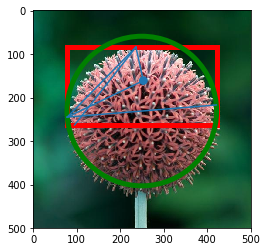

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 113,116,89  , HSI 65.81752564444359,0.16037735849056622,0.4156862745098039
[8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 22, 24, 26, 35, 36, 50, 53, 54, 55, 56, 61, 62, 63, 168, 170, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 22, 24, 26, 29, 30, 33, 35, 36, 39, 46, 48, 49, 50, 51, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 70, 166, 167, 168, 169, 170, 171, 6, 7, 8, 9, 10, 11, 12, 13, 168, 169, 170, 171, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 166, 167, 168, 169, 170, 172, 174]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


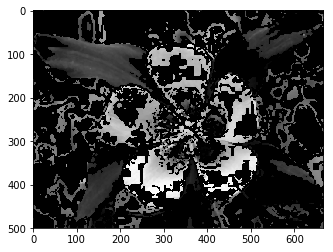

flower_category: 84
Petals count Algorithm started...
Number of Contours 299
Height 132, Width 161, Area 7329.5, extLeft: (133, 277), extRight: (293, 215), extTop: (190, 183), extBot: (233, 314), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 22698.006922186254, ellipse_area: 49791.89029808511, rect_area: 21252
Side 1: 109.9317970379817, Side 2: 88.32326986700618, Side 3: 75.39230729988306
Triangle Area: 3310.999999999999, Chosen Area for petals count: Circle, Area: 7329.5, petals: 3
flower_name:  'columbine'
Petal count Algorithm Ended.


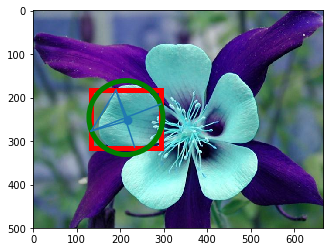

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 41,68,17  , HSI 91.94511908450383,0.5952380952380951,0.16470588235294115
[35, 40, 42, 43, 44, 45, 46, 47, 48, 34, 35, 36, 38, 40, 41, 42, 43, 44, 45, 46, 48, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 48, 21, 30, 34, 35, 38, 41, 42, 43, 45, 46, 48]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


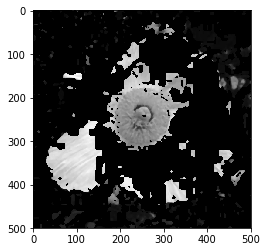

flower_category: 70
Petals count Algorithm started...
Number of Contours 122
Height 193, Width 200, Area 15888.0, extLeft: (159, 264), extRight: (358, 210), extTop: (244, 119), extBot: (214, 311), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 38013.2711084365, ellipse_area: 90087.90347738845, rect_area: 38600
Side 1: 168.0773631397161, Side 2: 115.00434774390054, Side 3: 91.41115905621152
Triangle Area: 4985.0000000000055, Chosen Area for petals count: Circle, Area: 15888.0, petals: 4
flower_name:  'tree poppy'
Petal count Algorithm Ended.


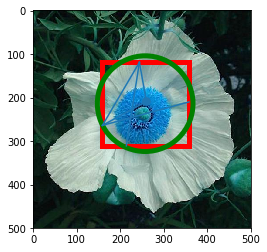

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 182,162,153  , HSI 17.647520824963408,0.07645875251509071,0.6496732026143791
[12, 13, 14, 15, 16, 17, 18, 19, 20, 30, 36, 0, 13, 14, 15, 16, 17, 18, 19, 30, 0, 1, 2, 3, 15, 17, 0, 1, 2, 3, 4, 15, 16, 17, 18, 19, 20, 21, 30, 36, 50, 177]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


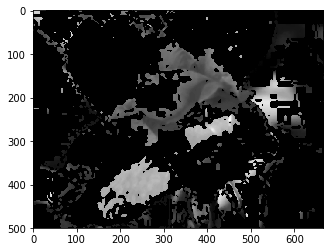

flower_category: 90
Petals count Algorithm started...
Number of Contours 84
Height 142, Width 169, Area 10510.5, extLeft: (146, 445), extRight: (314, 375), extTop: (257, 335), extBot: (167, 476), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 26015.528764377075, ellipse_area: 48493.5059490446, rect_area: 23998
Side 1: 156.27219842313605, Side 2: 97.94386147176351, Side 3: 70.83784299369935
Triangle Area: 2453.500000000003, Chosen Area for petals count: Circle, Area: 10510.5, petals: 5
flower_name:  'canna lily'
Petal count Algorithm Ended.


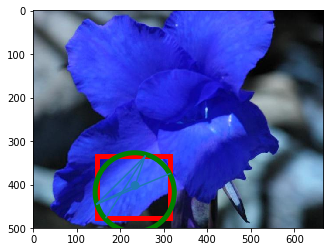

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 12,10,13  , HSI 280.89339464913087,0.1428571428571429,0.046296296296296294
[140, 156, 0, 120, 140, 156, 120, 140, 156, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 120, 132, 140]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


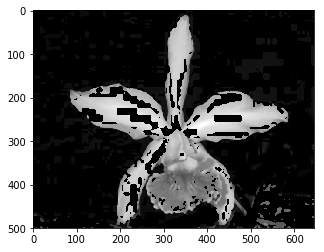

flower_category: 36
Petals count Algorithm started...
Number of Contours 79
Height 482, Width 504, Area 57118.0, extLeft: (84, 198), extRight: (587, 238), extTop: (348, 11), extBot: (440, 492), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 205887.41614566068, ellipse_area: 488790.9758433259, rect_area: 242928
Side 1: 323.51970573676033, Side 2: 259.7556544139126, Side 3: 250.28783430282823
Triangle Area: 31878.0, Chosen Area for petals count: Circle, Area: 57118.0, petals: 2
flower_name:  'ruby-lipped cattleya'
Petal count Algorithm Ended.


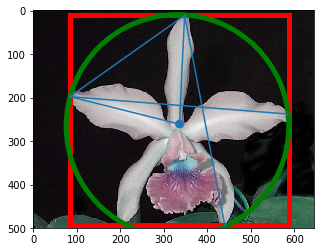

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 73,110,40  , HSI 91.8895851336928,0.4618834080717489,0.2915032679738562
[28, 30, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 55, 0, 24, 28, 30, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 63, 64, 66, 75, 103, 110, 120, 165, 0, 20, 24, 30, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 50, 75, 0, 13, 20, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 55, 56, 57, 60, 62, 63, 66, 120, 165]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


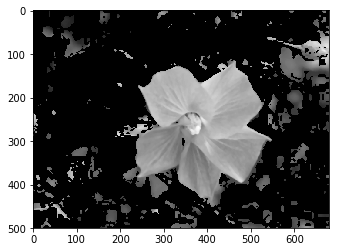

flower_category: 55
Petals count Algorithm started...
Number of Contours 106
Height 331, Width 345, Area 58812.5, extLeft: (203, 282), extRight: (547, 296), extTop: (462, 115), extBot: (410, 445), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 99538.22163633902, ellipse_area: 259512.188355292, rect_area: 114195
Side 1: 308.1720298794165, Side 2: 184.97837711473198, Side 3: 165.91865476793137
Triangle Area: 12903.499999999995, Chosen Area for petals count: Circle, Area: 58812.5, petals: 5
flower_name:  'pelargonium'
Petal count Algorithm Ended.


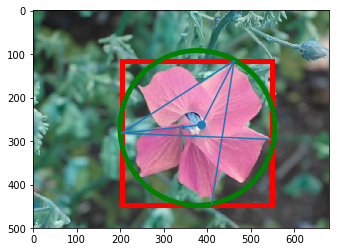

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 54,110,85  , HSI 153.53974679960572,0.3493975903614459,0.3254901960784314
[46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 70, 71, 72, 73, 74, 75, 76, 77, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 80, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 65, 66, 68, 69, 70, 71, 73, 74, 75, 76]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


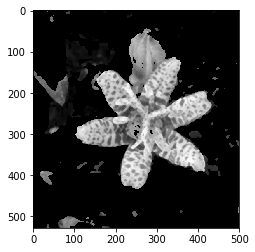

flower_category: 79
Petals count Algorithm started...
Number of Contours 117
Height 289, Width 282, Area 26766.0, extLeft: (152, 167), extRight: (433, 228), extTop: (182, 145), extBot: (256, 433), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 94024.72652928892, ellipse_area: 207125.9820069503, rect_area: 81498
Side 1: 37.20215047547655, Side 2: 186.560981987124, Side 3: 181.63975335812367
Triangle Area: 3377.0000000000023, Chosen Area for petals count: Circle, Area: 26766.0, petals: 8
flower_name:  'toad lily'
Petal count Algorithm Ended.


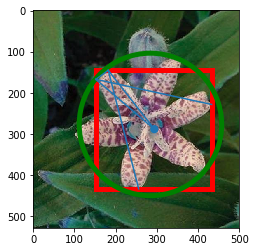

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 101,149,127  , HSI 152.75452038596444,0.1962864721485411,0.4928104575163399
[48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 35, 38, 43, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 40, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 30, 34, 35, 36, 42, 43, 48, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


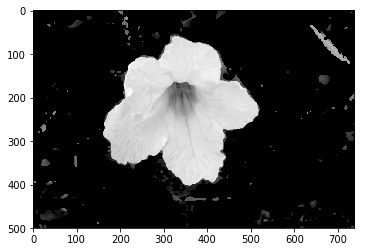

flower_category: 98
Petals count Algorithm started...
Number of Contours 14
Height 346, Width 359, Area 74736.0, extLeft: (160, 287), extRight: (518, 227), extTop: (324, 58), extBot: (360, 403), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 105208.79637606858, ellipse_area: 319366.845196671, rect_area: 124214
Side 1: 281.66824457151716, Side 2: 181.53236626012455, Side 3: 174.23260314877925
Triangle Area: 15298.500000000007, Chosen Area for petals count: Circle, Area: 74736.0, petals: 5
flower_name:  'mexican petunia'
Petal count Algorithm Ended.


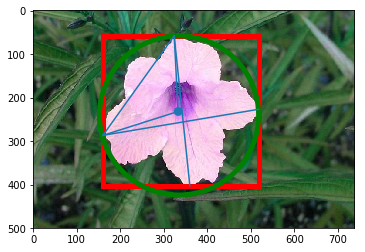

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 86,130,97  , HSI 133.89788624801398,0.17571884984025565,0.4091503267973856
[0, 30, 46, 48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 73, 75, 77, 80, 21, 22, 23, 24, 25, 26, 27, 30, 33, 34, 35, 38, 51, 55, 56, 58, 59, 61, 62, 64, 65, 68, 69, 71, 33, 34, 35, 66, 67, 68, 0, 19, 21, 23, 25, 26, 30, 35, 39, 43, 45, 46, 47, 48, 49, 50, 51, 52, 55, 56, 60]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


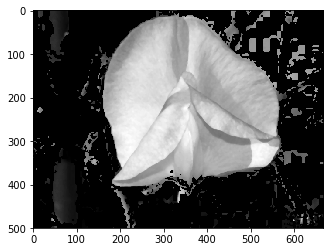

flower_category: 4
Petals count Algorithm started...
Number of Contours 103
Height 398, Width 407, Area 120694.0, extLeft: (159, 205), extRight: (565, 300), extTop: (333, 7), extBot: (236, 404), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 166190.25137490008, ellipse_area: 497241.8090971255, rect_area: 161986
Side 1: 263.59059163786554, Side 2: 194.3707796969493, Side 3: 210.95023109728987
Triangle Area: 20249.999999999996, Chosen Area for petals count: Circle, Area: 120694.0, petals: 6
flower_name:  'sweet pea'
Petal count Algorithm Ended.


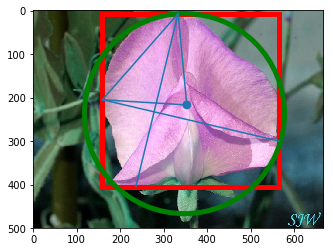

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 202,240,241  , HSI 181.28860348471687,0.11273792093704249,0.8928104575163399
[90, 91, 92, 90, 91, 92, 87, 89, 90, 91, 92, 91, 92, 93, 94]
[0, 0, 0, 0]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


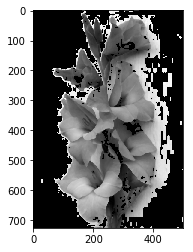

flower_category: 43
Petals count Algorithm started...
Number of Contours 137
Height 694, Width 250, Area 48493.5, extLeft: (221, 54), extRight: (470, 466), extTop: (272, 11), extBot: (317, 704), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 380459.4367203383, ellipse_area: 393606.5263578797, rect_area: 173500
Side 1: 66.70832032063167, Side 2: 330.54197917964973, Side 3: 351.14099732158877
Triangle Area: 10760.99999999999, Chosen Area for petals count: Circle, Area: 48493.5, petals: 5
flower_name:  'sword lily'
Petal count Algorithm Ended.


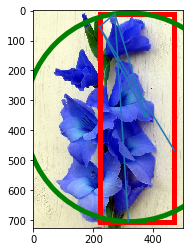

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 183,164,166  , HSI 354.5036334553454,0.040935672514619936,0.6705882352941176
[1, 41, 42, 43, 44, 45, 46, 47, 176, 177, 0, 1, 40, 41, 42, 43, 44, 45, 46, 47, 176, 177, 179, 4, 38, 39, 40, 41, 42, 176, 177, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


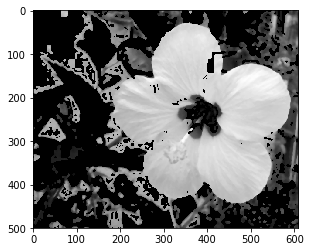

flower_category: 83
Petals count Algorithm started...
Number of Contours 153
Height 429, Width 447, Area 119405.5, extLeft: (145, 367), extRight: (591, 200), extTop: (357, 27), extBot: (295, 455), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 183984.23216483265, ellipse_area: 510528.85515914334, rect_area: 191763
Side 1: 400.6794229805169, Side 2: 258.48984506165806, Side 3: 224.8043593883357
Triangle Area: 26973.999999999993, Chosen Area for petals count: Circle, Area: 119405.5, petals: 5
flower_name:  'hibiscus'
Petal count Algorithm Ended.


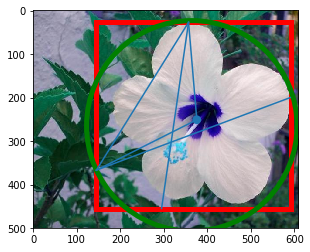

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 38,64,35  , HSI 114.60297189552371,0.23357664233576647,0.17908496732026147
[51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 69, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 63, 64, 0, 53, 54, 55, 56, 57, 58, 59]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


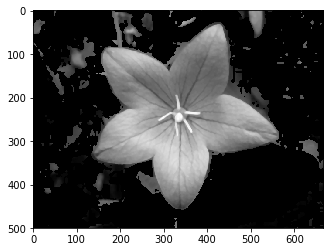

flower_category: 19
Petals count Algorithm started...
Number of Contours 33
Height 255, Width 409, Area 49779.5, extLeft: (151, 316), extRight: (559, 289), extTop: (218, 165), extBot: (322, 419), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 130740.51987179283, ellipse_area: 249414.50571731513, rect_area: 104295
Side 1: 165.19685227025363, Side 2: 190.07366992826755, Side 3: 172.53985046939155
Triangle Area: 13255.999999999996, Chosen Area for petals count: Circle, Area: 49779.5, petals: 4
flower_name:  'balloon flower'
Petal count Algorithm Ended.


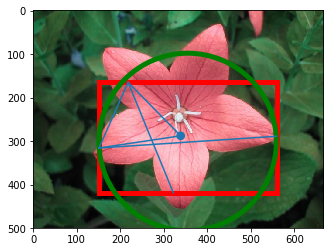

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 23,46,30  , HSI 137.2694722116017,0.303030303030303,0.12941176470588234
[0, 30, 50, 75, 0, 30, 50, 75, 0, 30, 75, 30, 75, 80, 81, 82, 83, 84, 96, 110]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


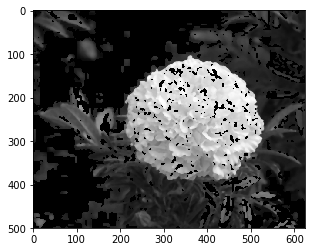

flower_category: 47
Petals count Algorithm started...
Number of Contours 188
Height 288, Width 322, Area 65379.5, extLeft: (210, 211), extRight: (531, 260), extTop: (360, 103), extBot: (426, 390), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 84496.27601095107, ellipse_area: 258909.79495338496, rect_area: 92736
Side 1: 184.83506160899236, Side 2: 164.2224101637776, Side 3: 145.34441853748632
Triangle Area: 11415.000000000004, Chosen Area for petals count: Circle, Area: 65379.5, petals: 6
flower_name:  'marigold'
Petal count Algorithm Ended.


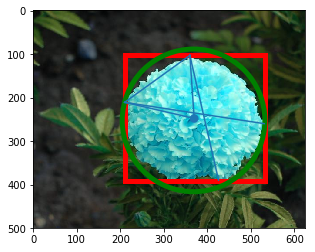

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


RGB 84,97,51  , HSI 75.90866575181944,0.34051724137931016,0.30326797385620907
[0, 3, 5, 6, 11, 35, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 150, 156, 158, 159, 160, 163, 164, 169, 170, 173, 174, 175, 177, 178, 0, 3, 5, 6, 8, 9, 10, 11, 12, 13, 14, 30, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 146, 150, 156, 158, 159, 160, 163, 164, 169, 170, 173, 174, 175, 177, 35, 38, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 0, 3, 5, 6, 8, 10, 11, 12, 13, 14, 16, 19, 20, 21, 24, 26, 30, 34, 35, 38, 39, 40, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 156, 164, 169, 170, 177]
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed
[0, 0, 0, 0]
Nothing Changed


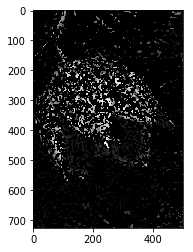

flower_category: 23
Petals count Algorithm started...
Number of Contours 624
Height 31, Width 35, Area 495.5, extLeft: (239, 300), extRight: (273, 307), extTop: (253, 291), extBot: (255, 321), Line1: Line2D(),\     Line2: Line2D(), Line3: Line2D(), circle_area: 1134.1149479459152, ellipse_area: 2590.670077586637, rect_area: 1085
Side 1: 16.64331697709324, Side 2: 19.6468827043885, Side 3: 14.866068747318506
Triangle Area: 120.50000000000003, Chosen Area for petals count: Circle, Area: 495.5, petals: 5
flower_name:  'fritillary'
Petal count Algorithm Ended.


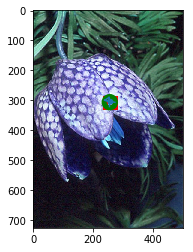

In [33]:
for k,v in petal_source_db.items():
    #print("k: {0}, v: {1}".format(k,v))
    img = cv2.imread(v, -1)
    plt.imshow(img)
    
    #BGR to HSI
    normalized_img = np.zeros(img.shape).astype(float)
    normalized_img = cv2.normalize(img.astype(float),normalized_img,0,1,cv2.NORM_MINMAX)
    img_converted = np.zeros_like(img,dtype='float')
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            H = 0
            S = 0
            I = 0
            R = float(normalized_img[i][j][2])
            G = float(normalized_img[i][j][1])
            B = float(normalized_img[i][j][0])
            RGB_sum = R + G + B
            RGB_min = min(R, G, B)
            #print("{} ,{} ,{} , {} , {}".format(R,G,B,RGB_min,RGB_sum))
            I = (1/3) * RGB_sum
            if R == G and G == B:
                H = 0
                S = 0
            else:
                S = 1 - ((3*RGB_min)/RGB_sum)
                if S > 0.9999:
                    S = 1
                if S < 0.00001:
                    S = 0
                    H = 0
                else:
                    dividend = (1/2) * ((R-G) + (R-B))
                    divisor = math.sqrt(math.pow((R-G),2) + (R-B)*(G-B))
                    w = dividend/divisor
                    if w > 1:
                        w=1
                    elif w < -1:
                        w = -1                    
                    H = math.acos(w)
                    if B > G:
                        H = (2*math.pi) - H
            img_converted[i][j][0] = H * (180 / math.pi)
            img_converted[i][j][1] = S
            img_converted[i][j][2] = I

    plt.imshow(img_converted)
    print("RGB {},{},{}  , HSI {},{},{}".format(img[0][0][2],img[0][0][1],img[0][0][0],img_converted[0][0][0]
                                               ,img_converted[0][0][1],img_converted[0][0][2]))
    #fig = plt.figure(figsize=(20,20))
    #ax = fig.add_subplot(4,4,1)
    #plt.imshow(img_converted[0:,0:20])
    #ax = fig.add_subplot(4,4,2)
    #plt.imshow(img_converted[0:20,0:])
    #ax = fig.add_subplot(4,4,3)
    #plt.imshow(img_converted[0:,-20:-1])
    #ax = fig.add_subplot(4,4,4)
    #plt.imshow(img_converted[-20:-1,0:])
    
    
    HSV_img = cv2.cvtColor(img,cv2.COLOR_BGR2HSV)
    #plt.imshow(HSV_img)
    
    #plt.hist(HSV_img.ravel(),256,[0,256])
    
    #fig = plt.figure(figsize=(20,20))
    #ax = fig.add_subplot(4,4,1)
    #plt.imshow(HSV_img[0:,0:20])
    #ax = fig.add_subplot(4,4,2)
    #plt.imshow(HSV_img[0:20,0:])
    #ax = fig.add_subplot(4,4,3)
    #plt.imshow(HSV_img[0:,-20:-1])
    #ax = fig.add_subplot(4,4,4)
    #plt.imshow(HSV_img[-20:-1,0:])
    
    filterd_HSV_filter = np.zeros_like(HSV_img)
    filterd_HSV_filter = cv2.normalize(HSV_img,filterd_HSV_filter,0,255,cv2.NORM_MINMAX)
    filter_size = 35
    for i in range(4):
        ratio = 4
        mask = np.zeros(HSV_img.shape[:2],np.uint8)
        mask[0:,0:filter_size] = 1
        mask[0:,-filter_size:-1] = 1
        mask[0:filter_size,0:] = 1
        mask[-filter_size:-1,0:] = 1
        filterd_HSV_filter = Remove_Freq_Values(filterd_HSV_filter,filter_size,ratio)
        #fig = plt.figure(figsize=(20,20))
        #ax = fig.add_subplot(2,2,1)
        #plt.imshow(HSV_img)
        #ax = fig.add_subplot(2,2,2)
        #plt.imshow(filterd_HSV_filter)
        filter_size += 5
        ratio += 4
    
    
    new_img = cv2.cvtColor(filterd_HSV_filter,cv2.COLOR_HSV2BGR)
    new_img2 = cv2.medianBlur(new_img,5)
    #fig = plt.figure(figsize=(20,20))
    #ax = fig.add_subplot(1,3,1)
    #plt.imshow(img)
    #ax = fig.add_subplot(1,3,2)
    #plt.imshow(new_img)
    #ax = fig.add_subplot(1,3,3)
    #plt.imshow(new_img2)
    
    gray = cv2.cvtColor(new_img2, cv2.COLOR_BGR2GRAY)
    plt.imshow(gray, cmap='gray')
    plt.show()
    
    

    #Get Flower category 
    pattern = '\\'
    truncated = v[v.rfind(pattern, 0, v.rfind(pattern)) + 1 : ]
    index2 = v[v.rfind(pattern, 0, v.rfind(pattern)) + 1 : ].rfind(pattern)
    flower_category = truncated[0: index2]
    print("flower_category: {0}".format(flower_category))
            
    
    if not cv2.imwrite(r'.\..\Storage\preview_filtered_flowers_for_petals' + "\\" + flower_category + "\\" + "gray.png", gray) :
        print("Unable to save in {0} due to internal problem".format(filtered_image_path + "\\" + "gray.png"))
        
    ret,thresh = cv2.threshold(gray,127,255,cv2.THRESH_BINARY_INV)
    
    #print("The Thresholded Image in Gray")
    #plt.imshow(thresh, cmap='gray')
    #plt.show()
    
    #print("The Thresholded Image in histogram")
    #(n2, bins2, patches) = plt.hist(gray.ravel(),256,[0,256])
    #plt.show()
    #print("Histogram values n2: {0}, bins2:{1}, patches:{2}".format(n2, bins2, patches))
    
    
    print("Petals count Algorithm started...")
    cnts, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE , cv2.CHAIN_APPROX_SIMPLE)
    print("Number of Contours {0}".format(len(cnts)))

    # Create figure and axes
    fig,ax = plt.subplots(1)

    # Display the image
    ax.imshow(img)

    count = 1
    max_width = 0
    max_width_contour = ()
    for c in cnts:
        # compute the bounding box of the contour and use the
        # bounding box to compute the aspect ratio

        #if count == 2:
        (x, y, w, h) = cv2.boundingRect(c)
        
        count = count + 1
                
        if ((h < img.shape[0] and w < img.shape[1]) and (max_width < w)):
            max_width =  w
            max_width_height_contour = (w, h, c)
            
    
    #if ((h > 300 and w > 300) and (h < img.shape[0] and w < img.shape[1])):
    #Petals count also start
    w = max_width_height_contour[0]
    h = max_width_height_contour[1]
    c = max_width_height_contour[2]

    (x, y, w, h) = cv2.boundingRect(c)
    contour_area = cv2.contourArea(c)
    rect_area = w * h


    rect = patches.Rectangle((x,y),w,h,linewidth=5,edgecolor='r',facecolor='none')
    ax.add_patch(rect)

    (min_cx,min_cy),radius = cv2.minEnclosingCircle(c)
    center = (int(min_cx),int(min_cy))
    radius = int(radius)
    circle = patches.Circle((min_cx, min_cy), radius=radius, linewidth=5, edgecolor='g',facecolor='none')
    ax.add_patch(circle)
    circle_area = math.pi * radius * radius

    (x, y), (MA, ma), angle = cv2.fitEllipse(c)
    ellipse_area = math.pi * MA * ma

    # determine the most extreme points along the contour
    extLeft = tuple(c[c[:, :, 0].argmin()][0])
    extRight = tuple(c[c[:, :, 0].argmax()][0])
    extTop = tuple(c[c[:, :, 1].argmin()][0])
    extBot = tuple(c[c[:, :, 1].argmax()][0])

    
    M = cv2.moments(c)
    cx = int(M["m10"] / M["m00"])
    cy = int(M["m01"] / M["m00"])
    center_circle = plt.Circle((cx, cy), 10)
    ax.add_patch(center_circle)
    
    line1 = mlines.Line2D([extLeft[0],extRight[0]], [extLeft[1],extRight[1]])
    line2 = mlines.Line2D([extTop[0],extBot[0]], [extTop[1],extBot[1]])
    line3 = mlines.Line2D([extLeft[0], extTop[0]], [extLeft[1], extTop[1]])
    
    #draw line from the center to the extreme points to create a proper triangle
    line4 = mlines.Line2D([extLeft[0], cx], [extLeft[1], cy])
    line5 = mlines.Line2D([extTop[0], cx], [extTop[1], cy])
    #img = cv2.line(img, extLeft, extRight, (0,255,0), 10)
    #img = cv2.line(img, extTop, extBot, (0,255,0), 10)
    #img = cv2.line(img, (extLeft[0], extTop[0]), (extLeft[1], extTop[1]), (0,255,0), 10)
    
    #img = cv2.line(img, (extLeft[0], extTop[0]), (extLeft[1], extTop[1]), (0,255,0), 10)

    str_data = "Height {0}, Width {1}, Area {2}, extLeft: {3}, extRight: {4}, extTop: {5}, extBot: {6}, Line1: {7},\ \
    Line2: {8}, Line3: {9}, circle_area: {10}, ellipse_area: {11}, rect_area: {12}".format(h, w, \
    contour_area, extLeft, extRight, extTop, extBot, line1, line2, line3, circle_area, ellipse_area, rect_area)
    print(str_data)

    ax.add_line(line1)
    ax.add_line(line2)
    ax.add_line(line3)
    ax.add_line(line4)
    ax.add_line(line5)

    side1 = distance(extLeft[0],extLeft[1], extTop[0], extTop[1])
    side2 = distance(extLeft[0],extLeft[1], cx, cy)
    side3 = distance(extTop[0], extTop[1], cx, cy)
    str_side = "Side 1: {0}, Side 2: {1}, Side 3: {2}".format(side1, side2, side3)
    print(str_side)
    semi_perimeter = (side1 + side2 + side3)/2
    traingle_area = math.sqrt(semi_perimeter*abs(semi_perimeter-side1)*abs(semi_perimeter-side2)*abs(semi_perimeter-side3))


    #list_areas = [rect_area, circle_area, ellipse_area]
    #index, value = max(enumerate(list_areas), key=operator.itemgetter(1))
    #print("Value: {0} Type: {1}".format(value, type(value)))
    #area_selected = numbers_to_strings(index)

    #Number of petals
    petals = math.ceil(contour_area/traingle_area)
    print("Triangle Area: {0}, Chosen Area for petals count: {1}, Area: {2}, petals: {3}".format(traingle_area, \
         "Circle", contour_area, petals))


    #Get flower name
    flower_name = oxford102_labels.loc[int(flower_category)].get('Names')
    print("flower_name: {0}".format(flower_name))

    #open the csv file to save the flower category name and petals count
    with open('flowers_with_petals_info.csv', 'a', newline='') as file:
        writer = csv.writer(file)
        writer.writerow([flower_category, flower_name, petals])             
            
    
    print("Petal count Algorithm Ended.")
 
    #Save Petal counted image
    plt.savefig(r'.\..\Storage\preview_filtered_flowers_for_petals' + "\\" + flower_category + "\\" + k)

    plt.show()
    
    time.sleep(2)

In [138]:
import pandas as pd
petals_info = pd.read_csv('flowers_with_petals_info.csv')
petals_info.head(50)

,Category,Name,Petals
0,53,'primula',2
1,59,'orange dahlia',5
2,37,'cape flower',4
3,73,'water lily',5
4,63,'black-eyed susan',3
5,69,'windflower',10
6,27,'prince of wales feathers',4
7,56,'bishop of llandaff',5
8,44,'poinsettia',3
9,12,"""colt's foot""",4


### Evaluation of Petal count accuracy using Hue based Image Segmentation

In [260]:
petals_df = pd.read_csv(r'C:\Users\indra\source\Upgrad\LJMU\App\Storage\petals_image_evaluation\train_labels.csv')

In [261]:
petals_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,image_00001.jpg,591,500,passion flower Petals uncountable,89,32,491,460
1,image_00002.jpg,625,500,passion flower Petals uncountable,100,27,570,489
2,image_00003.jpg,500,667,passion flower Petals uncountable,18,192,492,658
3,image_00004.jpg,667,500,passion flower Petals uncountable,132,42,545,471
4,image_00007.jpg,667,500,passion flower Petals uncountable,82,51,582,419


In [262]:
petals_2_df = petals_df[['filename', 'class']].copy()

In [263]:
petals_2_df.head()

,filename,class
0,image_00001.jpg,passion flower Petals uncountable
1,image_00002.jpg,passion flower Petals uncountable
2,image_00003.jpg,passion flower Petals uncountable
3,image_00004.jpg,passion flower Petals uncountable
4,image_00007.jpg,passion flower Petals uncountable


In [264]:
petals_2_df.loc[petals_2_df.filename  == 'image_00261.jpg']

,filename,class
212,image_00261.jpg,water lily Petals 8


In [265]:
image_names = []
petals_desc = []
for name, values in petals_2_df.iteritems():
    
    if name  == 'filename':
        image_names = values
    else:
        petals_desc = values

In [266]:
dic_org_petals = {}
flower_names = []
petals_counts = []
for names, desc in zip(image_names, petals_desc):
    
    if 'uncountabl' in desc and 'Petals' in desc:
        index = desc.rfind('Petals')
        flower_name = desc[ : index].strip()
        petals = 'uncountable'
    elif 'uncountabl' not in desc and 'Petals' in desc:
        index = desc.rfind('Petals')
        flower_name = desc[ : index].strip()
        petals = desc[index + 7 : ].replace(' ','')

    elif 'uncountable' in desc:
        index = desc.rfind('uncountabl')
        flower_name = desc[ : index].strip()
        petals = 'uncountable'

    else:
        print(names, desc)
        break
    
    flower_name = '\'' + flower_name + '\''
    #print(flower_name)
    petals_counts.append(petals)
    dic_org_petals[flower_name] = petals

In [207]:
image_petals_names = []
petals_num = []
for name, values in petals_info.iteritems():
    if name  == 'Name':
        image_petals_names = values
    elif name == 'Petals':
        petals_num = values

In [267]:
dic_petals = {}
for name, desc in zip(image_petals_names, petals_num):
    dic_petals[name] = desc

In [268]:
for k, v in dic_petals.items():
    print(k, v, end= ' ')

 'silverbush' 6  'canterbury bells' 6  'watercress' 5  'sunflower' 4  "colt's foot" 4  'bird of paradise' 3  'primula' 2  'lenten rose' 4  'cyclamen ' 4  'japanese anemone' 6  'black-eyed susan' 3  'bolero deep blue' 3  'monkshood' 6  'garden phlox' 7  'spring crocus' 8  'tree mallow' 2  'great masterwort' 6  'alpine sea holly' 3  'siam tulip' 5  'blackberry lily' 3  'tiger lily' 4  'blanket flower' 4  'globe-flower' 12  'english marigold' 5  'giant white arum lily' 5  'windflower' 10  'clematis' 4  'prince of wales feathers' 4  'bishop of llandaff' 5  'barbeton daisy' 5  'fire lily' 3  'pelargonium' 5  'thorn apple' 5  'oxeye daisy' 5  'corn poppy' 3  'mallow' 3  'mexican petunia' 5  'peruvian lily' 5  'magnolia' 6  'sweet william' 5  'orange dahlia' 5  'daffodil' 5  'bee balm' 26  'anthurium' 4  'gaura' 3  'lotus' 5  'artichoke' 4  'purple coneflower' 5  'stemless gentian' 3  'grape hyacinth' 3  'californian poppy' 6  'moon orchid' 4  'hippeastrum ' 6  'hibiscus' 5  'mexican aster' 5

In [289]:
uncountable_count = 0
for k, v in dic_org_petals.items():
    #print(k, v, end= ' ')
    if 'uncountable' in v or 'uncontable' in v:
        uncountable_count = uncountable_count + 1

print('Total Actual Uncountable', uncountable_count)

Total Actual Uncountable 26


In [211]:
len(dic_org_petals)

103

In [291]:
matched_huebased = {}
unmatched_huebased = []
unmatched__uncountable_huebased = []
flagged = False
for k, v in dic_org_petals.items():
            
    for key in dic_petals.keys():
        dic_petals_key = key.replace('\'', '').strip()
        #print("dic_petals_key", dic_petals_key, end=' ')
        dic_org_petals_key = k.replace('\'', '').strip()
        #print("dic_org_petals_key", dic_org_petals_key)
        if  dic_petals_key.strip() ==  dic_org_petals_key:
            flagged = True
            
            range_petals = []
            if '-' in v and 'layers' not in v:
                index = v.rfind('-')
                min_range = int(v[: index])
                print('min_range', min_range)
                max_range = int(v[index + 1: ])
                print('max_range', max_range)
                range_petals = list(range(min_range, max_range))
            elif '-' in v and 'layers' in v:
                index = v.rfind('-')
                index2 = v.rfind('layers')
                min_range = int(v[: index])
                print('min_range_layers', min_range)
                max_range = int(v[index + 1: index2])
                print('max_range_layers', max_range)
                range_petals = list(range(min_range, max_range))
            elif 'maximum' in v:
                index = v.rfind('maximum')
                max_val = v[index + 7:]
                min_range = 1
                max_range = int(max_val)
                print('max_range', max_range)
                range_petals = list(range(min_range, max_range))
                                
                
            if ('uncountable' not in v and 'uncontable' not in v and len(range_petals) == 0 \
                               and int(v) == int(dic_petals[key])) \
                               or ((len(range_petals) > 0) and int(dic_petals[key]) in range_petals):
                matched_huebased[k] = int(dic_petals[key])
                break
            elif ('uncountable' not in v and 'uncontable' not in v):
                print('UNMATCHED', k, v, 'CALCULATED', dic_petals[key])
                unmatched_huebased.append(k)
                break
            else:
                print('UNMATCHED', k, v, 'CALCULATED', dic_petals[key])
                unmatched__uncountable_huebased.append(k)
    
    if not flagged:
        print(k, 'NOT FOUND')

UNMATCHED 'watercress' 6 CALCULATED 5
UNMATCHED 'monkshood' 5 CALCULATED 6
UNMATCHED 'foxglove' uncountable CALCULATED 4
min_range 20
max_range 40
UNMATCHED 'rose' 20-40 CALCULATED 6
UNMATCHED 'morning glory' 5 CALCULATED 4
UNMATCHED 'windflower' 6 CALCULATED 10
UNMATCHED 'marigold' uncountable CALCULATED 6
UNMATCHED 'prince of wales feathers' uncountable CALCULATED 4
UNMATCHED 'king protea' 10 CALCULATED 4
UNMATCHED 'tiger lily' 6 CALCULATED 4
UNMATCHED 'lenten rose' 5 CALCULATED 4
min_range 20
max_range 25
UNMATCHED 'lotus' 20-25 CALCULATED 5
UNMATCHED 'fire lily' 6 CALCULATED 3
UNMATCHED 'clematis' 8 CALCULATED 4
UNMATCHED 'frangipani' 5 CALCULATED 4
UNMATCHED 'bromelia' uncountable CALCULATED 4
UNMATCHED 'silverbush' 5 CALCULATED 6
UNMATCHED 'water lily' uncountable CALCULATED 5
UNMATCHED 'snapdragon' 5 CALCULATED 4
max_range 20
UNMATCHED 'daffodil' 6 CALCULATED 5
UNMATCHED 'corn poppy' 4 CALCULATED 3
UNMATCHED 'great masterwort' 5 CALCULATED 6
UNMATCHED 'pincushion flower' uncount

In [295]:
print('Total Matched', len(matched_huebased))
print('Total Unmatched', len(unmatched_huebased))
print('Total Unmatched Uncountable', len(unmatched__uncountable_huebased))
#print('Total Number of Images', len(petals_2_df.index))
print(' ')
print('Details of Matched Categories')
for k, v in matched_huebased.items():
    print('Category:', k, 'Petals:', v)

Total Matched 16
Total Unmatched 60
Total Unmatched Uncountable 24
 
Details of Matched Categories
Category: 'mexican petunia' Petals: 5
Category: 'azalea' Petals: 5
Category: 'black-eyed susan' Petals: 3
Category: 'geranium' Petals: 5
Category: 'buttercup' Petals: 5
Category: 'sweet william' Petals: 5
Category: 'canna lily' Petals: 5
Category: 'trumpet creeper' Petals: 5
Category: 'hippeastrum' Petals: 6
Category: 'thorn apple' Petals: 5
Category: 'canterbury bells' Petals: 6
Category: 'barbeton daisy' Petals: 5
Category: 'pelargonium' Petals: 5
Category: 'bougainvillea' Petals: 5
Category: 'english marigold' Petals: 5
Category: 'hibiscus' Petals: 5


### Evaluation of Petal count accuracy using K-Means and Image Thresholding

In [1]:
import numpy as np
from numpy import array
from numpy import argmax
import pandas as pd

import random
random.seed(32)

import glob
import h5py

import os
from os import listdir

import json
import datetime
import time
from tqdm import tqdm

#Plotting libraries
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

#image handling libraries
import cv2
import scipy
import scipy.io
from scipy import ndimage

#skimage library imports
from skimage import io, filters, morphology, measure
from skimage.measure import label,  regionprops
from skimage.filters import sobel

from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder

import pickle

# keras imports
import tensorflow as tf
from tensorflow import keras
from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications.vgg19 import VGG19, preprocess_input
from keras.applications.xception import Xception, preprocess_input
from keras.applications.resnet50 import ResNet50, preprocess_input
from keras.applications.inception_resnet_v2 import InceptionResNetV2, preprocess_input
from keras.applications.mobilenet import MobileNet, preprocess_input
from keras.applications.inception_v3 import InceptionV3, preprocess_input

from keras.preprocessing import image
from keras.preprocessing.image import img_to_array, load_img
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

from keras.models import Model, load_model, model_from_json
from keras.layers import Input, Dense, LSTM, Embedding, Dropout, GlobalAveragePooling2D, GlobalAveragePooling3D
from keras.layers.merge import add
from keras.utils import plot_model, to_categorical
from keras.callbacks import ModelCheckpoint


#Diagnostic libraries
from nltk.translate.bleu_score import corpus_bleu

c:\programdata\anaconda3\envs\datta_tensorflow_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
c:\programdata\anaconda3\envs\datta_tensorflow_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
c:\programdata\anaconda3\envs\datta_tensorflow_gpu\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
c:\programdata\anaconda3\env

In [2]:
#Extract image number from the image name of the image database
def get_flower_id(file):
    return file.split('.')[0].split('_')[1]

In [3]:
get_flower_id('image_004456.jpg')

'004456'

In [4]:
def get_flower_name(file):
    index = file.rfind('\\')
    return file[ index + 1 : ]

In [5]:
get_flower_name(r'C:\Users\indra\source\Upgrad\LJMU\App\Storage\petals_image_evaluation\train\image_02987.jpg')

'image_02987.jpg'

In [6]:
# Get count of number of files in this folder and all subfolders
def get_num_files(path):
    if not os.path.exists(path):
        return 0
  
    data_dic = {}
    count = 0
    for r, d, files in os.walk(path):
        for image_name in files:
            
            if '.xml' in image_name:
                continue
            print(image_name)
            id = get_flower_name(image_name)
            data_dic[id] = os.path.abspath(os.path.join(r, image_name))

    return data_dic

In [7]:
#image_database will be used throughout this project for getting all the flower information from the image database 
train_image_database = get_num_files(r'C:\Users\indra\source\Upgrad\LJMU\App\Storage\petals_image_evaluation\train')

image_00001.jpg
image_00002.jpg
image_00003.jpg
image_00004.jpg
image_00007.jpg
image_00008.jpg
image_00009.jpg
image_00010.jpg
image_00011.jpg
image_00012.jpg
image_00013.jpg
image_00014.jpg
image_00015.jpg
image_00016.jpg
image_00017.jpg
image_00018.jpg
image_00019.jpg
image_00020.jpg
image_00021.jpg
image_00022.jpg
image_00023.jpg
image_00026.jpg
image_00027.jpg
image_00030.jpg
image_00031.jpg
image_00032.jpg
image_00033.jpg
image_00034.jpg
image_00035.jpg
image_00036.jpg
image_00037.jpg
image_00038.jpg
image_00039.jpg
image_00040.jpg
image_00041.jpg
image_00042.jpg
image_00043.jpg
image_00044.jpg
image_00045.jpg
image_00046.jpg
image_00047.jpg
image_00048.jpg
image_00049.jpg
image_00051.jpg
image_00052.jpg
image_00053.jpg
image_00054.jpg
image_00055.jpg
image_00056.jpg
image_00057.jpg
image_00058.jpg
image_00062.jpg
image_00064.jpg
image_00066.jpg
image_00067.jpg
image_00068.jpg
image_00069.jpg
image_00070.jpg
image_00073.jpg
image_00074.jpg
image_00075.jpg
image_00076.jpg
image_00

image_05256.jpg
image_05259.jpg
image_05260.jpg
image_05261.jpg
image_05262.jpg
image_05263.jpg
image_05264.jpg
image_05266.jpg
image_05268.jpg
image_05269.jpg
image_05271.jpg
image_05273.jpg
image_05274.jpg
image_05275.jpg
image_05276.jpg
image_05291.jpg
image_05292.jpg
image_05293.jpg
image_05294.jpg
image_05295.jpg
image_05297.jpg
image_05298.jpg
image_05299.jpg
image_05300.jpg
image_05301.jpg
image_05302.jpg
image_05304.jpg
image_05305.jpg
image_05306.jpg
image_05307.jpg
image_05309.jpg
image_05310.jpg
image_05311.jpg
image_05312.jpg
image_05313.jpg
image_05314.jpg
image_05315.jpg
image_05316.jpg
image_05317.jpg
image_05318.jpg
image_05319.jpg
image_05320.jpg
image_05322.jpg
image_05323.jpg
image_05325.jpg
image_05327.jpg
image_05328.jpg
image_05329.jpg
image_05332.jpg
image_05333.jpg
image_05334.jpg
image_05335.jpg
image_05336.jpg
image_05337.jpg
image_05338.jpg
image_05339.jpg
image_05359.jpg
image_05363.jpg
image_05365.jpg
image_05367.jpg
image_05369.jpg
image_05370.jpg
image_05

In [8]:
len(train_image_database)

5281

In [9]:
for k, v in train_image_database.items():
    print(k, v)
    break

image_07636.jpg C:\Users\indra\source\Upgrad\LJMU\App\Storage\petals_image_evaluation\train\image_07636.jpg


In [10]:
#Convert RGB to Gray image
def rgb2gray(rgb):
    return np.dot(rgb[...,:3], [0.299, 0.587, 0.144])

In [11]:
#Create Masked images using KNN, will be used for Petals count calculation
def CreateMaskedImageUsingKNN(training_img_data_set):
    
    dic_masked_img = {}
    
    for key, img in tqdm(training_img_data_set.items()) :
        pic = img/255  # dividing by 255 to bring the pixel values between 0 and 1

        pic_n = pic.reshape(pic.shape[0]*pic.shape[1], pic.shape[2])
    
        kmeans = KMeans(n_clusters=2, random_state=0).fit(pic_n)
        pic2show = kmeans.cluster_centers_[kmeans.labels_]
        cluster_pic = pic2show.reshape(pic.shape[0], pic.shape[1], pic.shape[2])
        gray = rgb2gray(cluster_pic)
        
        gray_reshaped = gray.reshape(gray.shape[0], gray.shape[1], 1)
        
        dic_masked_img[key] = gray_reshaped
    
    return dic_masked_img

In [12]:
def load_image_data():
    
    img_data = {}
    
    for id, img_path in train_image_database.items():
        
        image = cv2.imread(img_path,0)
        #image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        #image = cv2.resize(image, (256,256))
        img_data[id] = image
                
    return img_data 

In [13]:
training_images_for_image_thresholding_technique = load_image_data()

In [14]:
for k, v in training_images_for_image_thresholding_technique.items():
    print(k, v)
    break

image_01751.jpg [[ 21  21  19 ...  40  36  35]
 [ 24  23  22 ...  51  46  44]
 [ 26  25  24 ...  63  57  53]
 ...
 [157 146 144 ...  19  19  19]
 [175 156 137 ...  19  19  19]
 [175 159 139 ...  19  19  19]]


In [61]:
masked_img_dataset_dictionary = CreateMaskedImageUsingKNN(training_images)

100%|██████████████████████████████████████████████████████████████████████████████| 5281/5281 [22:19<00:00,  3.94it/s]


In [233]:
petals_df = pd.read_csv(r'C:\Users\indra\source\Upgrad\LJMU\App\Storage\petals_image_evaluation\train_labels.csv')

In [234]:
petals_df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,image_00001.jpg,591,500,passion flower Petals uncountable,89,32,491,460
1,image_00002.jpg,625,500,passion flower Petals uncountable,100,27,570,489
2,image_00003.jpg,500,667,passion flower Petals uncountable,18,192,492,658
3,image_00004.jpg,667,500,passion flower Petals uncountable,132,42,545,471
4,image_00007.jpg,667,500,passion flower Petals uncountable,82,51,582,419


In [235]:
petals_2_df = petals_df[['filename', 'class']].copy()

In [236]:
petals_2_df.head()

,filename,class
0,image_00001.jpg,passion flower Petals uncountable
1,image_00002.jpg,passion flower Petals uncountable
2,image_00003.jpg,passion flower Petals uncountable
3,image_00004.jpg,passion flower Petals uncountable
4,image_00007.jpg,passion flower Petals uncountable


In [237]:
image_names = []
petals_desc = []
for name, values in petals_2_df.iteritems():
    
    if name  == 'filename':
        image_names = values
    else:
        petals_desc = values

In [238]:
dic_petals = {}
flower_names = []
petals_counts = []
for names, desc in zip(image_names, petals_desc):
    index = desc.rfind('Petals')
    flower_names.append(desc[ : index].replace(' ',''))
    petals_counts.append(desc[index + 7 : ].replace(' ',''))
    dic_petals[names] = desc[index + 7 : ].replace(' ','')

In [246]:
len(dic_petals)

5280

In [240]:
petals_2_df['Category'] = flower_names
petals_2_df['Petals'] = petals_counts

In [241]:
petals_2_df.head()

,filename,class,Category,Petals
0,image_00001.jpg,passion flower Petals uncountable,passionflower,uncountable
1,image_00002.jpg,passion flower Petals uncountable,passionflower,uncountable
2,image_00003.jpg,passion flower Petals uncountable,passionflower,uncountable
3,image_00004.jpg,passion flower Petals uncountable,passionflower,uncountable
4,image_00007.jpg,passion flower Petals uncountable,passionflower,uncountable


In [242]:
petals_2_df.drop(['class'], axis=1, inplace=True)

In [243]:
petals_2_df.head()

,filename,Category,Petals
0,image_00001.jpg,passionflower,uncountable
1,image_00002.jpg,passionflower,uncountable
2,image_00003.jpg,passionflower,uncountable
3,image_00004.jpg,passionflower,uncountable
4,image_00007.jpg,passionflower,uncountable


In [244]:
petals_count_dic = {}
for (key, img_masked) in training_images.items():
  
    #im = np.reshape(img_masked*255, (256, 256))
    val = filters.threshold_otsu(img_masked)
    drops = ndimage.binary_fill_holes(img_masked < val)
  
    label_image = measure.label(drops)
    count = 0
    #print(key, " ")
    region_list = []
    for region in regionprops(label_image):
        region_list.append(region.area)
        #if region.area > 30 :
         #   count = count + 1
  
    region_list.sort(reverse=True)
    first = 0
    for idx, val in enumerate(region_list):
        
        if idx == 0:
            first = val
        else:
            if val < first and len(str(val)) >= 4:
                count = count + 1
        
    #print(" ")
    petals_count_dic[key] = count

In [125]:
dic_petals['image_02117.jpg']

'5'

In [103]:
len(petals_count_dic)

5281

In [245]:
for k , v in petals_count_dic.items():
    print(k,v)
    break

image_06767.jpg 2


In [99]:
petals_matched = {}
petals_not_matched = {}
for k, v in dic_petals.items():
    
    
    range_petals = []
    if '-' in v:
        index = v.rfind('-')
        min_range = int(v[: index])
        max_range = int(v[index + 1: ])
        range_petals = list(range(min_range, max_range))
        print( k, range_petals)
    
    if (petals_count_dic[k] != v) or (petals_count_dic[k] not in range_petals):
        petals_not_matched[k] = str(petals_count_dic[k])
    else:
        petals_matched[k] = v

image_06767.jpg 4
unmatched image_06767.jpg 4 6
image_06419.jpg 5
unmatched image_06419.jpg 5 3
image_04319.jpg 3
unmatched image_04319.jpg 3 18
image_02117.jpg 5
unmatched image_02117.jpg 5 1
image_06877.jpg uncountable
unmatched image_06877.jpg uncountable 13
image_00242.jpg uncountable
unmatched image_00242.jpg uncountable 8
image_07384.jpg uncountable
unmatched image_07384.jpg uncountable 25
image_06096.jpg uncountable
unmatched image_06096.jpg uncountable 7
image_07294.jpg 6
unmatched image_07294.jpg 6 16
image_07620.jpg 9
unmatched image_07620.jpg 9 1
image_00364.jpg uncountable
unmatched image_00364.jpg uncountable 1
image_06747.jpg 4
unmatched image_06747.jpg 4 2
image_07908.jpg uncountable
unmatched image_07908.jpg uncountable 5
image_01511.jpg uncountable
unmatched image_01511.jpg uncountable 9
image_01915.jpg 20-25
image_01915.jpg [20, 21, 22, 23, 24]
unmatched image_01915.jpg 20-25 2
image_07113.jpg uncontable
unmatched image_07113.jpg uncontable 1
image_07038.jpg 6
unmatch

ValueError: invalid literal for int() with base 10: '7layers'

In [100]:
len(petals_not_matched)

136

In [98]:
len(petals_matched)

0

In [101]:
for k, v in petals_not_matched.items():
    print(k, v)
    break

image_06877.jpg 13
